## Case Study Submission by Saptarshi Ghosh and Nitin Balaji Srinivasan, Cohort 58 - AI and ML

## Telecom Churn Group Case Study

#### Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from 
one operator to another. In this highly competitive market, the telecommunications industry experiences 
an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than 
to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. 
In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify 
customers at high risk of churn, and identify the main indicators of churn.

Customer behaviour during churn:

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time 
(this is especially applicable to high-value customers). 
In churn prediction, we assume that there are three phases of customer lifecycle :

1) The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

2) The ‘action’ phase: The customer experience starts to sore in this phase, for 
    e.g. he/she gets a compelling offer from a competitor, faces unjust charges, 
    becomes unhappy with service quality etc. 
    In this phase, the customer usually shows different behaviour than the ‘good’ months. 
    It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken 
    at this point (such as matching the competitor’s offer/improving the service quality etc.)

3) The ‘churn’ phase: In this phase, the customer is said to have churned. 
    
    In this case, since we are working over a four-month window, the first two months (June and July) are the ‘good’ phase, 
    the third month (August) is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

#### Objective:

The main goal of the case study is to build ML models to predict churning customers based on the features provided 
for their usage. 

1) The model will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). 
By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

2) It will be used to identify important variables that are strong predictors of churn. These variables may also indicate 
why customers choose to switch to other networks.

We will use overall accuracy as primary evaluation metric, however we would also calculate other metrics like precision, 
recall, etc. for the different models that can be used for evaluation purposes based on different business objectives. 


One of the key objectives of this ML model is to identify customers who will definitely churn with more accuracy 
as compared to the ones who will not churn. Therefore we will focus on 'Sensitivity' as a key metric 
throughout the comparison of all models

#### Approach:

We will perform PCA for dimensionality reduction to predict churning customers, provided this helps with a corresponding 
improvement in the subsequent accuracy levels too.
However given PCA will not help with the interpration of the important variables of churn, we will build  two models 
to address the objectives 1) and 2) separately. 

#### Important Assumption:

Since the problem statement from Kaggle refers to four months and the training dataset only contains three months, we assume that 
the 4th month (churn phase month - September) has already been removed from the dataset. 

Therefore we do not exclude any columns for analysis on the basis of churn phase.  

### Steps:
- Data Understanding
- Data Cleansing (Missing data imputation)
- EDA (Univariate--->Bivariate--->Heatmaps)
- Feature Engineering
- Feature Selection (PCA)
- Model Development with PCA (To predict churn) i.e. Logistic Regression->Decision Tree->Random Forest->GDB->XGB->Catboost..SVM
- Model Evaluation  (Sensitivity,Precision,accuracy,AOC)
- Two Final Models (two different approaches)
- Model Development without PCA (To identify important features)


In [1]:
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.float', '{:.4f}'.format)

In [2]:
#opening the data:
data=pd.read_csv('/Users/rishismac/telecom-churn-case-study-hackathon-c58/train.csv')
#data = pd.read_csv('train.csv')
print(data.info(verbose=1))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [3]:
#making a dictionary of the missing data percentage :
dict(data.isna().sum()/len(data)*100)

{'id': 0.0,
 'circle_id': 0.0,
 'loc_og_t2o_mou': 1.0028714695924228,
 'std_og_t2o_mou': 1.0028714695924228,
 'loc_ic_t2o_mou': 1.0028714695924228,
 'last_date_of_month_6': 0.0,
 'last_date_of_month_7': 0.570008142973471,
 'last_date_of_month_8': 1.0471578165402362,
 'arpu_6': 0.0,
 'arpu_7': 0.0,
 'arpu_8': 0.0,
 'onnet_mou_6': 3.954342204888641,
 'onnet_mou_7': 3.8386262660895154,
 'onnet_mou_8': 5.2900755725081785,
 'offnet_mou_6': 3.954342204888641,
 'offnet_mou_7': 3.8386262660895154,
 'offnet_mou_8': 5.2900755725081785,
 'roam_ic_mou_6': 3.954342204888641,
 'roam_ic_mou_7': 3.8386262660895154,
 'roam_ic_mou_8': 5.2900755725081785,
 'roam_og_mou_6': 3.954342204888641,
 'roam_og_mou_7': 3.8386262660895154,
 'roam_og_mou_8': 5.2900755725081785,
 'loc_og_t2t_mou_6': 3.954342204888641,
 'loc_og_t2t_mou_7': 3.8386262660895154,
 'loc_og_t2t_mou_8': 5.2900755725081785,
 'loc_og_t2m_mou_6': 3.954342204888641,
 'loc_og_t2m_mou_7': 3.8386262660895154,
 'loc_og_t2m_mou_8': 5.2900755725081785

In [4]:
# Describe the dataset numerical columns
data.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.0000,69999.0000,69297.0000,69297.0000,69297.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,

### Data Understanding and Cleansing

In [5]:
from sklearn.impute import SimpleImputer

In [6]:
data.dtypes.value_counts()

float64    135
int64       28
object       9
Name: count, dtype: int64

In [7]:
num_variables=[col for col in data.columns if data[col].dtype!='O']
num_variables

['id',
 'circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og

### Imputing the recharge columns:


In [8]:
recharge_cols=[col for col in data.columns if 'rech' in col and col in num_variables]
imputer=SimpleImputer(strategy='constant', fill_value=0)
data[recharge_cols]=imputer.fit_transform(data[recharge_cols])
data[recharge_cols].isna().sum()*100/len(data)

total_rech_num_6     0.0000
total_rech_num_7     0.0000
total_rech_num_8     0.0000
total_rech_amt_6     0.0000
total_rech_amt_7     0.0000
total_rech_amt_8     0.0000
max_rech_amt_6       0.0000
max_rech_amt_7       0.0000
max_rech_amt_8       0.0000
total_rech_data_6    0.0000
total_rech_data_7    0.0000
total_rech_data_8    0.0000
max_rech_data_6      0.0000
max_rech_data_7      0.0000
max_rech_data_8      0.0000
count_rech_2g_6      0.0000
count_rech_2g_7      0.0000
count_rech_2g_8      0.0000
count_rech_3g_6      0.0000
count_rech_3g_7      0.0000
count_rech_3g_8      0.0000
av_rech_amt_data_6   0.0000
av_rech_amt_data_7   0.0000
av_rech_amt_data_8   0.0000
dtype: float64

### Imputing the flag columns:

In [9]:
# The following columns seem to be flags but classed as numerical, so can impute them with 0 too.

flag_cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']

data[flag_cols] =imputer.fit_transform(data[flag_cols])
 
data[flag_cols].isna().sum()*100/len(data)

night_pck_user_6   0.0000
night_pck_user_7   0.0000
night_pck_user_8   0.0000
fb_user_6          0.0000
fb_user_7          0.0000
fb_user_8          0.0000
dtype: float64

In [10]:
#creating a dataframe of 'isna' to understand the missing data better:
isna_df=pd.DataFrame(data.isna().sum()/len(data)*100)
isna_df=isna_df.sort_values(by=0,ascending=False)
isna_df=isna_df.reset_index()
isna_df.columns=['feature','percentage']
isna_df

,feature,percentage
0,arpu_3g_6,74.9025
1,arpu_2g_6,74.9025
2,date_of_last_rech_data_6,74.9025
3,arpu_3g_7,74.4782
4,arpu_2g_7,74.4782
5,date_of_last_rech_data_7,74.4782
6,arpu_3g_8,73.6896
7,date_of_last_rech_data_8,73.6896
8,arpu_2g_8,73.6896
9,loc_ic_t2t_mou_8,5.2901


### Dropping the columns having too much missing data and less relevance:

In [11]:
# Taking only those columns which have a missing data percentage less than 30 percent:
relevent_columns_df=isna_df[isna_df['percentage']<30]
relevent_columns_df
imp_columns=list(relevent_columns_df['feature'])
imp_columns
data_refined_1=data[imp_columns]
pd.DataFrame(data_refined_1.isna().sum()/len(data)*100).shape


(163, 1)

### Handling the date variables:

In [12]:
date_variables=[x for x in data_refined_1.columns if data_refined_1[x].dtype=='O']
date_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6']

In [13]:
##Extracting days of the month into separate columns
length=len(date_variables)
for i in range(length):
    string='day_from_'+date_variables[i]
    data_refined_1[string] = pd.DatetimeIndex(data_refined_1[date_variables[i]]).day
    date_variables.append(string)


In [14]:
date_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6',
 'day_from_date_of_last_rech_8',
 'day_from_date_of_last_rech_7',
 'day_from_date_of_last_rech_6',
 'day_from_last_date_of_month_8',
 'day_from_last_date_of_month_7',
 'day_from_last_date_of_month_6']

## Date Derived Metrics:

In [15]:
# Difference between last date of recharge and last date of month to calculate recency.

data_refined_1["days_since_rechg_6"] = (data_refined_1["day_from_last_date_of_month_6"] - data_refined_1["day_from_date_of_last_rech_6"])+1
date_variables.append('days_since_rechg_6')

data_refined_1["days_since_rechg_7"] = (data_refined_1["day_from_last_date_of_month_7"] - data_refined_1["day_from_date_of_last_rech_7"])+1
date_variables.append('days_since_rechg_7')

data_refined_1["days_since_rechg_8"] = (data_refined_1["day_from_last_date_of_month_8"] - data_refined_1["day_from_date_of_last_rech_8"])+1
date_variables.append('days_since_rechg_8')

# Derive presence or absence of last date of month columns.

data_refined_1["month_present_6"] = (data_refined_1["day_from_last_date_of_month_6"] - data_refined_1["day_from_last_date_of_month_6"])+1
date_variables.append('month_present_6')

data_refined_1["month_present_7"] = (data_refined_1["day_from_last_date_of_month_7"] - data_refined_1["day_from_last_date_of_month_7"])+1
date_variables.append('month_present_7')

data_refined_1["month_present_8"] = (data_refined_1["day_from_last_date_of_month_8"] - data_refined_1["day_from_last_date_of_month_8"])+1
date_variables.append('month_present_8')


In [16]:
pd.DataFrame(data_refined_1[date_variables].isna().sum()/len(data)*100)

,0
date_of_last_rech_8,3.5158
date_of_last_rech_7,1.7629
date_of_last_rech_6,1.5729
last_date_of_month_8,1.0472
last_date_of_month_7,0.5700
last_date_of_month_6,0.0000
day_from_date_of_last_rech_8,3.5158
day_from_date_of_last_rech_7,1.7629
day_from_date_of_last_rech_6,1.5729
day_from_last_date_of_month_8,1.0472


In [17]:
#Describe the columns of interest 

data_refined_1[date_variables].describe(percentiles=[.25,.5,.75,.90,.95,.99])

,day_from_date_of_last_rech_8,day_from_date_of_last_rech_7,day_from_date_of_last_rech_6,day_from_last_date_of_month_8,day_from_last_date_of_month_7,day_from_last_date_of_month_6,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_6,month_present_7,month_present_8
count,67538.0000,68765.0000,68898.0000,69266.0000,69600.0000,69999.0000,68898.0000,68765.0000,67538.0000,69999.0000,69600.0000,69266.0000
mean,25.4420,25.5057,24.1281,31.0000,31.0000,30.0000,6.8719,6.4943,6.5580,1.0000,1.0000,1.0000
std,6.1080,5.7658,6.1348,0.0000,0.0000,0.0000,6.1348,5.7658,6.1080,0.0000,0.0000,0.0000
min,1.0000,1.0000,1.0000,31.0000,31.0000,30.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
25%,24.0000,23.0000,21.0000,31.0000,31.0000,30.0000,2.0000,2.0000,2.0000,1.0000,1.0000,1.0000
50%,27.0000,27.0000,27.0000,31.0000,31.0000,30.0000,4.0000,5.0000,5.0000,1.0000,1.0000,1.0000
75%,30.0000,30.0000,29.0000,31.0000,31.0000,30.0000,10.0000,9.0000,8.0000,1.0000,1.0000,1.0000
90%,31.0000,31.0000,30.0000,31.0000,31.0000,30.0000,17.0000,15.0000,15.0000,1.0000,1.0000,1.0000
95%,31.0000,31.0000,30.0000,31.0000,31.0000,30.0000,19.0000,17.0000,21.0000,1.0000,1.0000,1.0000
99%,31.0000,31.0000,30.0000,31.0000,31.0000,30.0000,26.0000,26.0000,27.0000,1.0000,1.0000,1.0000


In [18]:
# Drop the date and day columns

drop_variables=['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6',
 'day_from_date_of_last_rech_8',
 'day_from_date_of_last_rech_7',
 'day_from_date_of_last_rech_6',
 'day_from_last_date_of_month_8',
 'day_from_last_date_of_month_7',
 'day_from_last_date_of_month_6',]
data_refined_1 = data_refined_1.drop(drop_variables, axis=1)

In [19]:
date_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6',
 'day_from_date_of_last_rech_8',
 'day_from_date_of_last_rech_7',
 'day_from_date_of_last_rech_6',
 'day_from_last_date_of_month_8',
 'day_from_last_date_of_month_7',
 'day_from_last_date_of_month_6',
 'days_since_rechg_6',
 'days_since_rechg_7',
 'days_since_rechg_8',
 'month_present_6',
 'month_present_7',
 'month_present_8']

In [20]:
# We can see that the minimum on the days since recharge and months present is always 1, so we can impute the null values with 0 on those columns
days_col_impute = ['days_since_rechg_6',
 'days_since_rechg_7',
 'days_since_rechg_8',
 'month_present_6',
 'month_present_7',
 'month_present_8']
    
data_refined_1[days_col_impute] = data_refined_1[days_col_impute].apply(lambda x: x.fillna(0))

In [21]:
# cols_to_impute list
cols_to_impute = []
for col in data_refined_1.select_dtypes(include=['float64','int64']).columns:
    if data_refined_1[col].isnull().any():
        cols_to_impute.append(col)
        
# We can see the missing values are less than 6% in every column, so we can impute them with 0

data_refined_1[cols_to_impute] = data_refined_1[cols_to_impute].apply(lambda x: x.fillna(0))

In [22]:
#### Duplication

data_refined_1.duplicated().any().sum()


0

### Deleting unique value columns

In [23]:
#### Checking if there are single value columns
unq_check = pd.DataFrame(data_refined_1.nunique())

single_value_cols=list(unq_check[unq_check[0]==1].index)
data_refined_1=data_refined_1.drop(single_value_cols, axis=1)


### Last few Derived Metrics:

In [24]:
data_refined_1[data_refined_1['churn_probability']==1][['arpu_6','arpu_7','arpu_8','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_og_mou_6','total_og_mou_7','total_og_mou_8']].describe()


,arpu_6,arpu_7,arpu_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_og_mou_6,total_og_mou_7,total_og_mou_8
count,7132.0000,7132.0000,7132.0000,7132.0000,7132.0000,7132.0000,7132.0000,7132.0000,7132.0000
mean,308.2891,219.0814,114.2264,350.7841,244.2951,120.8212,352.3708,242.8774,92.6249
std,385.7236,321.4953,245.5850,455.0306,386.0527,287.7826,568.1268,495.7050,289.5931
min,-209.4650,-158.9630,-155.2360,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,96.0935,14.7453,0.0000,100.0000,0.0000,0.0000,2.1300,0.0000,0.0000
50%,210.6765,118.3480,9.9695,236.0000,120.0000,0.0000,138.9100,38.7900,0.0000
75%,409.3358,289.5435,137.0132,473.2500,326.0000,136.0000,458.5300,261.8100,35.2750
max,11505.5080,6876.3240,5731.3270,12000.0000,9095.0000,7917.0000,8488.3600,8285.6400,5206.2100


In [25]:
#data_refined_1[['total_rech_amt_6','total_rech_amt_7']]
data_refined_1['rech_diff_6_8']=data_refined_1['total_rech_amt_8']-data_refined_1['total_rech_amt_6']
data_refined_1['arpu_diff_6_8']=data_refined_1['arpu_8']-data_refined_1['arpu_6']
data_refined_1['og_mou_diff_6_8']=data_refined_1['total_og_mou_8']-data_refined_1['total_og_mou_6']


## Checking imbalance of data:

In [26]:
churn_percentage=round(data_refined_1['churn_probability'].sum()/len(data)*100,2)
churn_percentage

10.19

## EDA:

In [27]:
# Given the high number of columns, we can categorise some of the key columns with these variables
import re
total_amounts = [i for i in list(data_refined_1.columns) if re.search('total.+amt',i)]
total_outgoing_minutes = [i for i in list(data_refined_1.columns) if re.search('total.+og.+mou',i)]
total_incoming_minutes = [i for i in list(data_refined_1.columns) if re.search('total.+ic.+mou',i)]
offnetwork_minutes = [i for i in list(data_refined_1.columns) if re.search('offnet',i)]
volume_3g = [i for i in list(data_refined_1.columns) if re.search('vol.+3g',i)]
volume_2g = [i for i in list(data_refined_1.columns) if re.search('vol.+2g',i)]
age_on_network = [i for i in list(data_refined_1.columns) if re.search('aon',i)]

#Storing them in a single flat list
variables = [ 'id', 
             *total_amounts, 
             *total_incoming_minutes,
             *total_outgoing_minutes, 
             *offnetwork_minutes, 
             *volume_3g,
             *volume_2g,
             *age_on_network, 
             'arpu_6','arpu_7','arpu_8','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8',
             'rech_diff_6_8','arpu_diff_6_8','og_mou_diff_6_8',
             'churn_probability']

trim_data_for_EDA = data_refined_1[variables].set_index('id')

In [28]:
#variables
trim_data_for_EDA

,total_rech_amt_8,total_rech_amt_6,total_rech_amt_7,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,offnet_mou_8,offnet_mou_6,offnet_mou_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_8,vol_2g_mb_7,vol_2g_mb_6,aon,arpu_6,arpu_7,arpu_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,rech_diff_6_8,arpu_diff_6_8,og_mou_diff_6_8,churn_probability
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,10.0000,77.0000,65.0000,40.5600,53.0400,11.8400,3.6300,221.6800,81.2100,2.3300,32.2400,96.6800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1958,31.2770,87.0090,7.5270,77.0000,65.0000,10.0000,-67.0000,-23.7500,-77.5800,0
1,50.0000,0.0000,145.0000,25.0400,39.4400,3.4400,31.6600,30.7300,0.0000,30.8900,0.0000,25.9900,3.9600,0.0000,0.0000,0.0000,352.9100,0.0000,710,0.0000,122.7870,42.9530,0.0000,145.0000,50.0000,50.0000,42.9530,31.6600,0
2,0.0000,70.0000,120.0000,36.6400,33.8300,124.2900,0.0000,99.3600,56.4900,0.0000,53.9900,82.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,882,60.8060,103.1760,0.0000,70.0000,120.0000,0.0000,-70.0000,-60.8060,-56.4900,0
3,130.0000,160.0000,240.0000,83.8400,50.1800,95.1100,53.8400,95.9800,76.0300,50.2300,68.7600,78.4800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,982,156.3620,205.2600,111.0950,160.0000,240.0000,130.0000,-30.0000,-45.2670,-22.1900,0
4,122.0000,290.0000,136.0000,28.3100,9.3600,21.5400,15.7600,42.9400,63.2600,9.6300,56.9900,38.1100,0.0000,0.0000,0.0000,213.4700,308.8900,390.8000,647,240.7080,128.1910,101.5650,290.0000,136.0000,122.0000,-168.0000,-139.1430,-47.5000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,512.0000,50.0000,397.0000,269.5600,221.9900,0.0000,392.5800,496.6800,0.0000,381.6400,0.0000,488.4600,0.0000,0.0000,0.0000,144.3100,244.5900,0.0000,221,15.7600,410.9240,329.1360,50.0000,397.0000,512.0000,462.0000,313.3760,392.5800,0
69995,308.0000,200.0000,313.0000,136.0100,112.4300,80.2400,280.6900,292.7400,166.2100,48.0600,49.5300,96.2800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,712,160.0830,289.1290,265.7720,200.0000,313.0000,308.0000,108.0000,105.6890,114.4800,0
69996,397.0000,626.0000,250.0000,414.5400,416.5800,542.1800,342.2900,296.3900,412.6800,263.8400,335.5400,227.9400,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,879,372.0880,258.3740,279.7820,626.0000,250.0000,397.0000,-229.0000,-92.3060,-70.3900,0


In [29]:
# Selecting the Numerical and Categorical features for analysis

numeric_cols = trim_data_for_EDA.select_dtypes(include=['float64','int64']).columns
categorical_cols = flag_cols+['month_present_7','month_present_8']
categorical_cols

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'month_present_7',
 'month_present_8']

#### Univariate analysis

Column: total_rech_amt_8, Missing Data: 0.00%


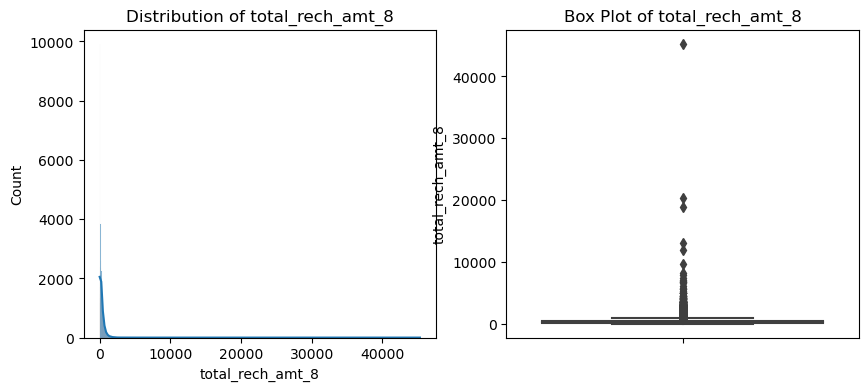

Column: total_rech_amt_6, Missing Data: 0.00%


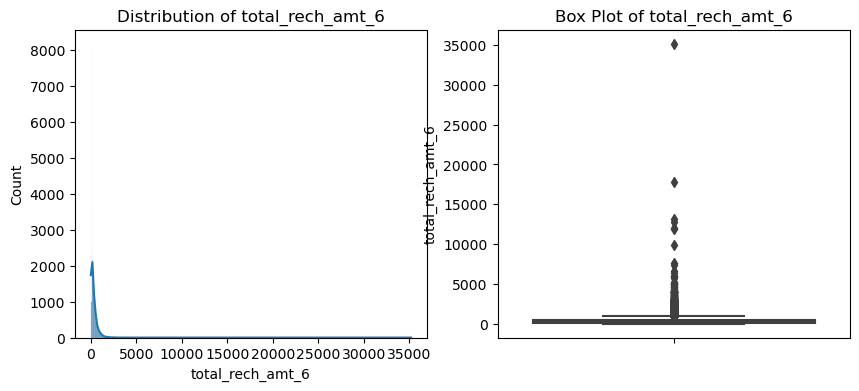

Column: total_rech_amt_7, Missing Data: 0.00%


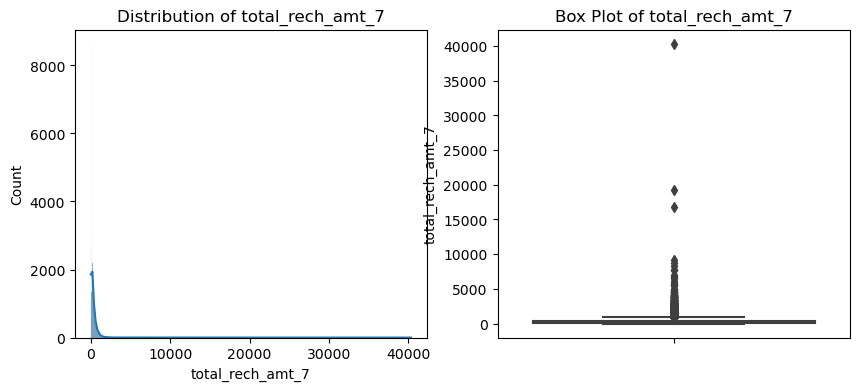

Column: total_ic_mou_8, Missing Data: 0.00%


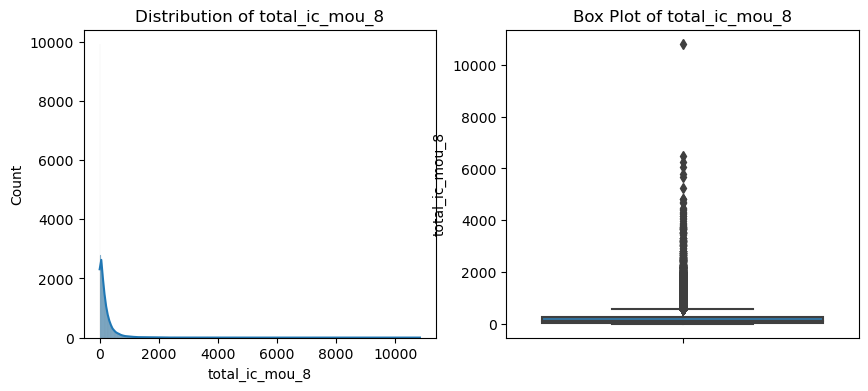

Column: total_ic_mou_7, Missing Data: 0.00%


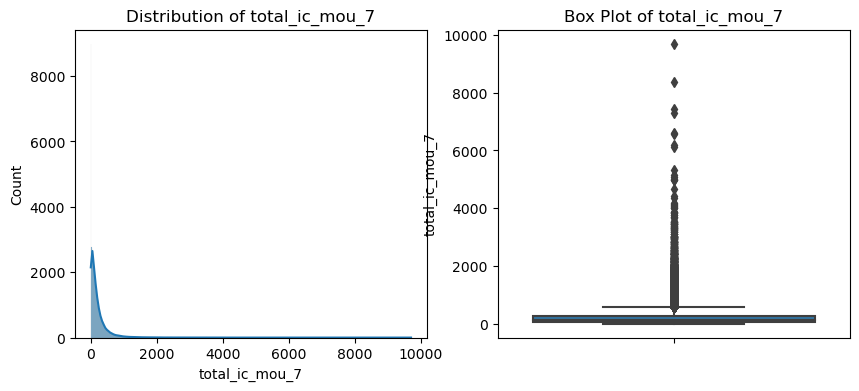

Column: total_ic_mou_6, Missing Data: 0.00%


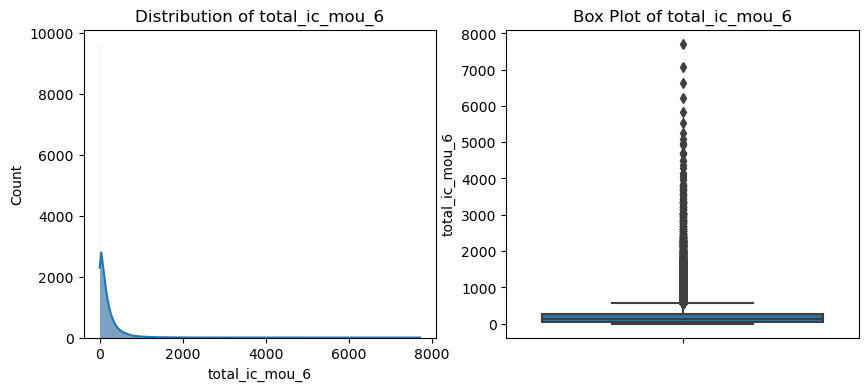

Column: total_og_mou_8, Missing Data: 0.00%


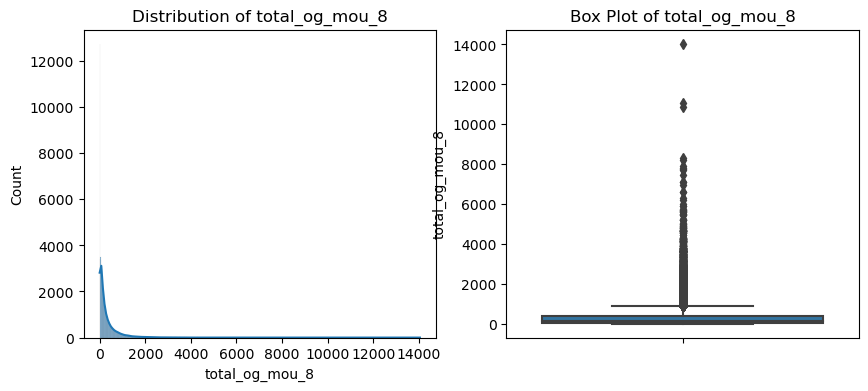

Column: total_og_mou_7, Missing Data: 0.00%


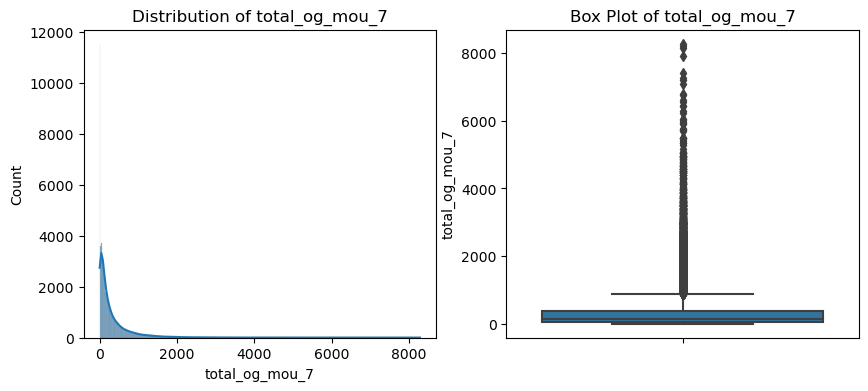

Column: total_og_mou_6, Missing Data: 0.00%


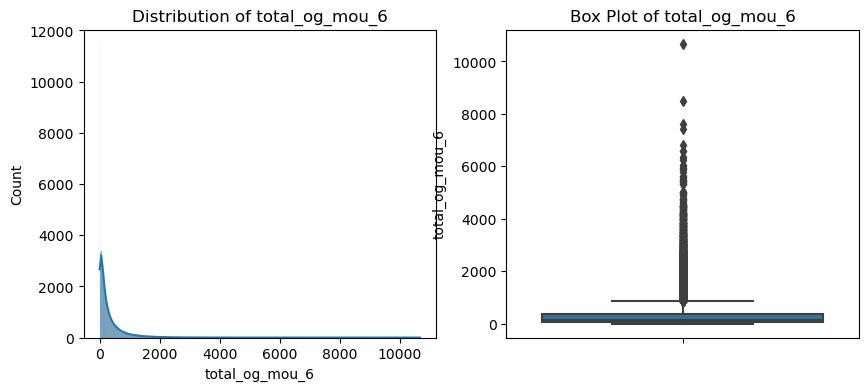

Column: offnet_mou_8, Missing Data: 0.00%


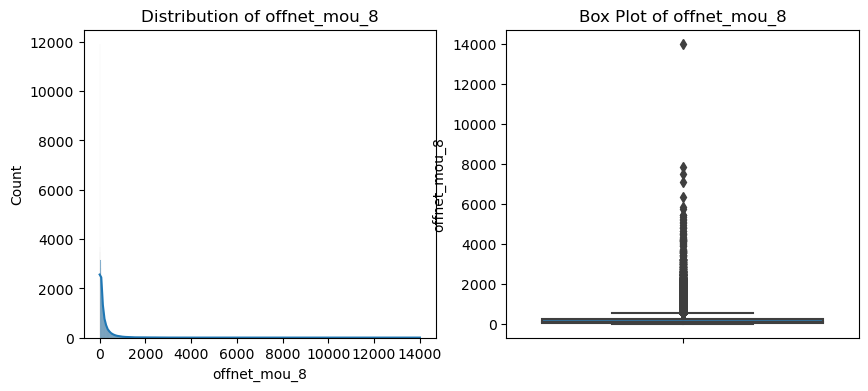

Column: offnet_mou_6, Missing Data: 0.00%


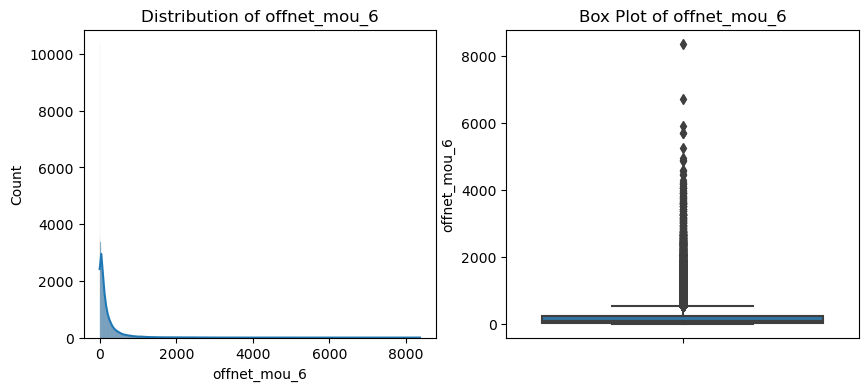

Column: offnet_mou_7, Missing Data: 0.00%


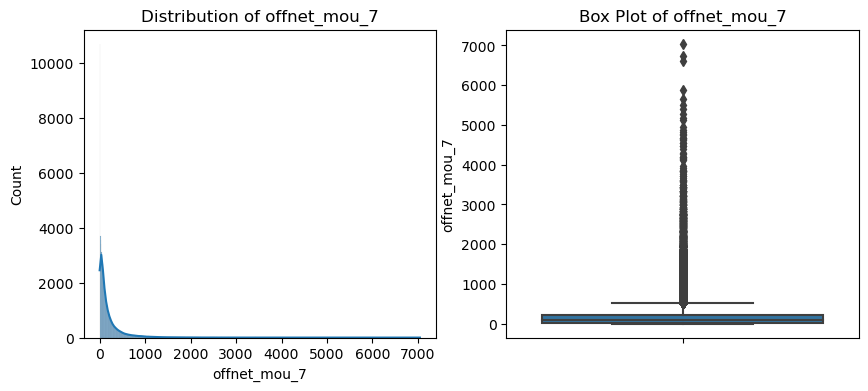

Column: vol_3g_mb_7, Missing Data: 0.00%


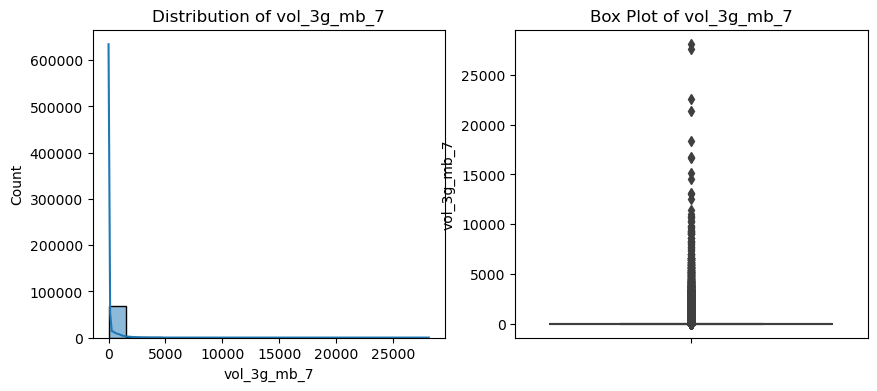

Column: vol_3g_mb_8, Missing Data: 0.00%


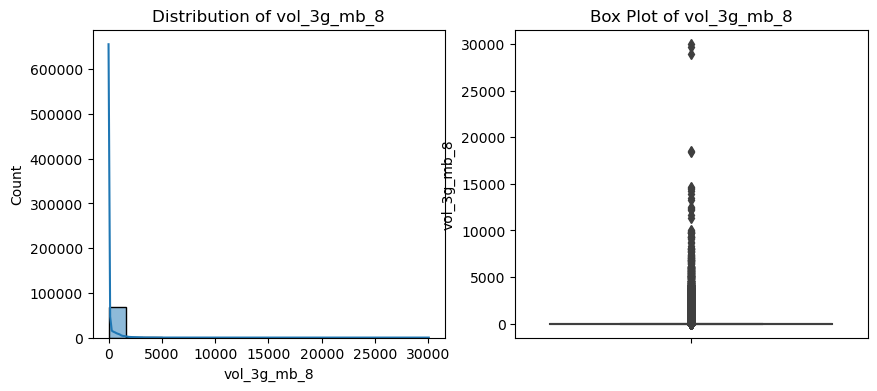

Column: vol_3g_mb_6, Missing Data: 0.00%


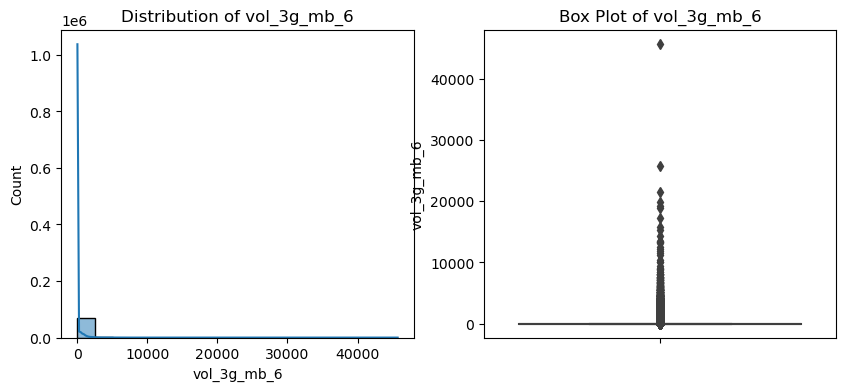

Column: vol_2g_mb_8, Missing Data: 0.00%


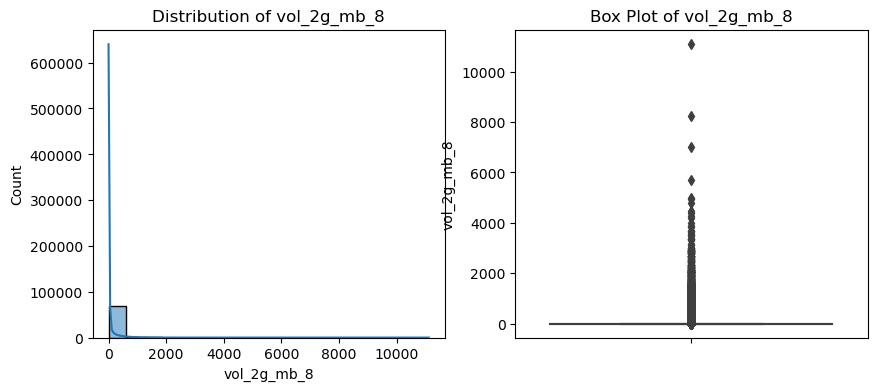

Column: vol_2g_mb_7, Missing Data: 0.00%


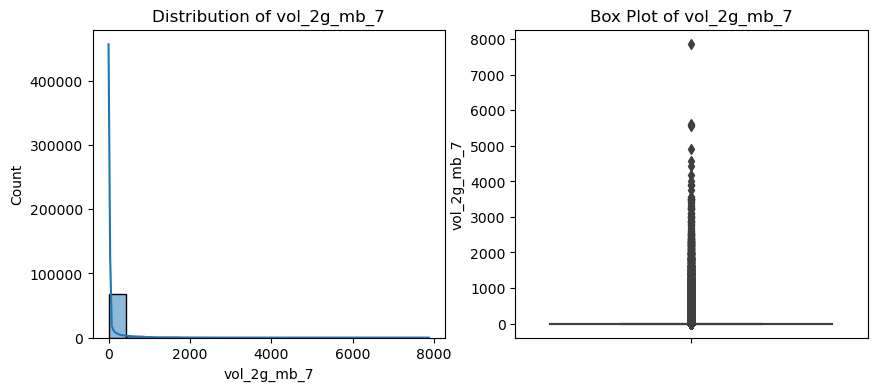

Column: vol_2g_mb_6, Missing Data: 0.00%


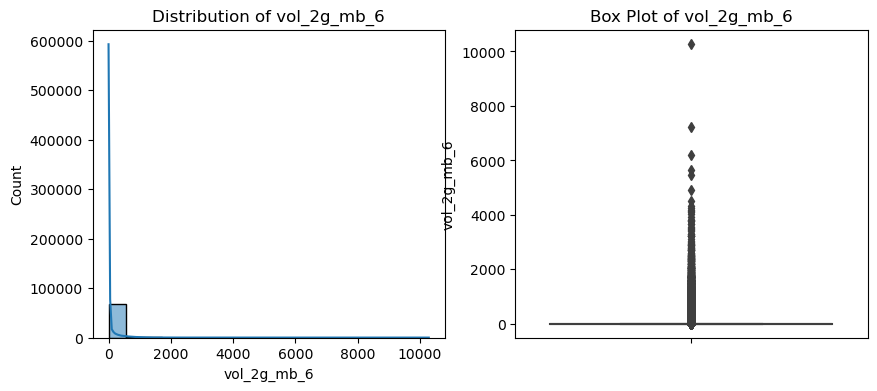

Column: aon, Missing Data: 0.00%


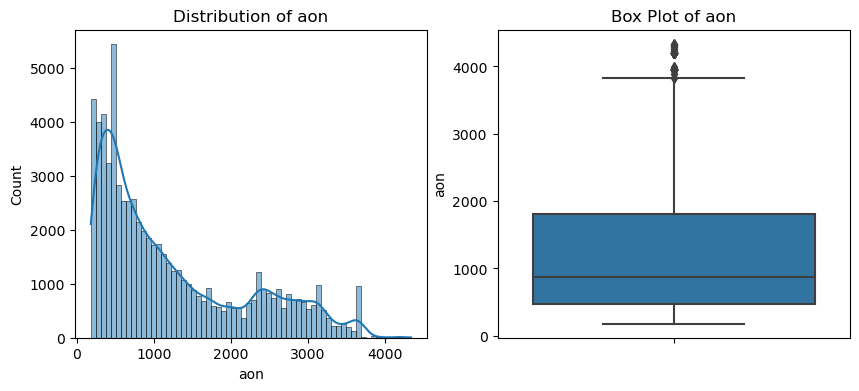

Column: arpu_6, Missing Data: 0.00%


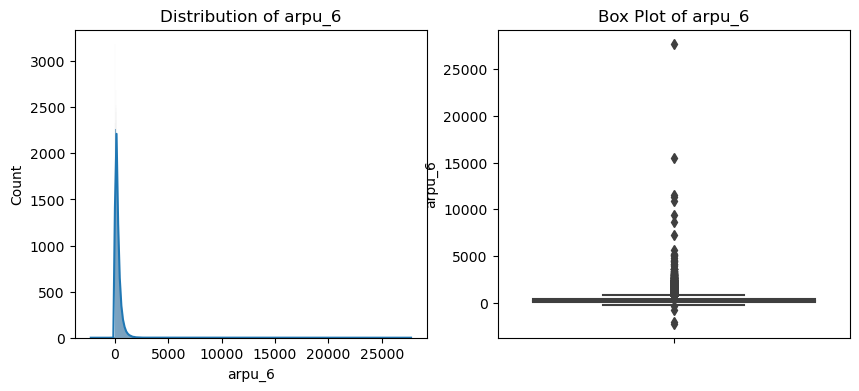

Column: arpu_7, Missing Data: 0.00%


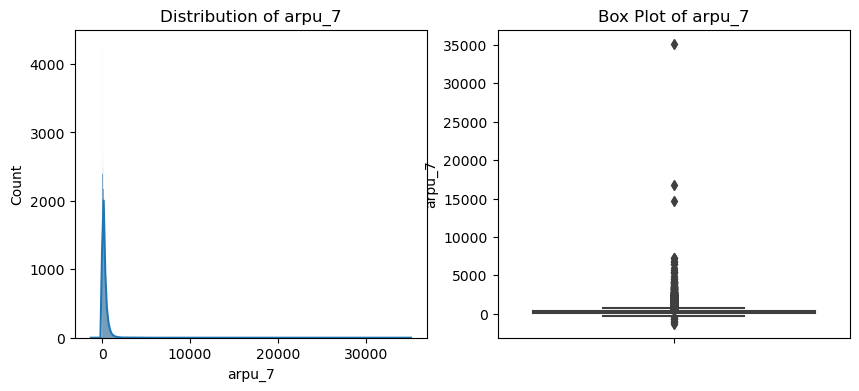

Column: arpu_8, Missing Data: 0.00%


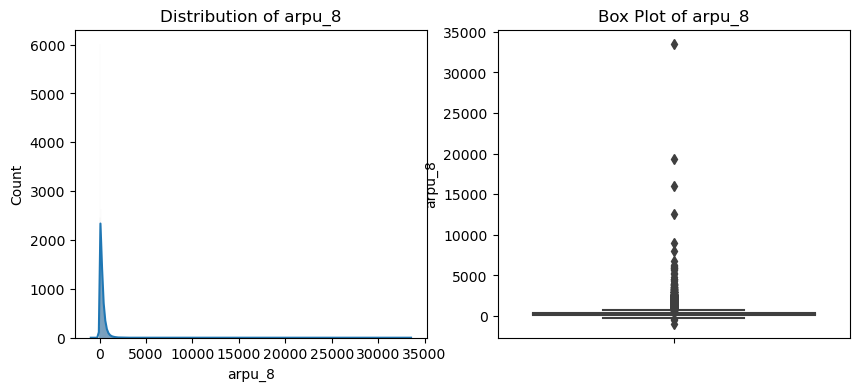

Column: total_rech_amt_6, Missing Data: 0.00%


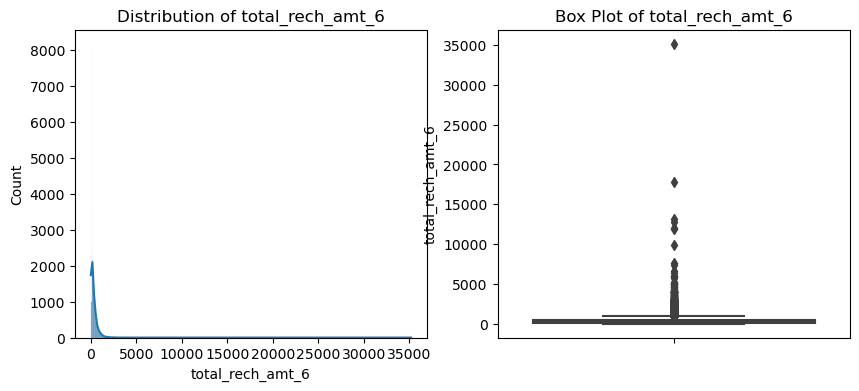

Column: total_rech_amt_7, Missing Data: 0.00%


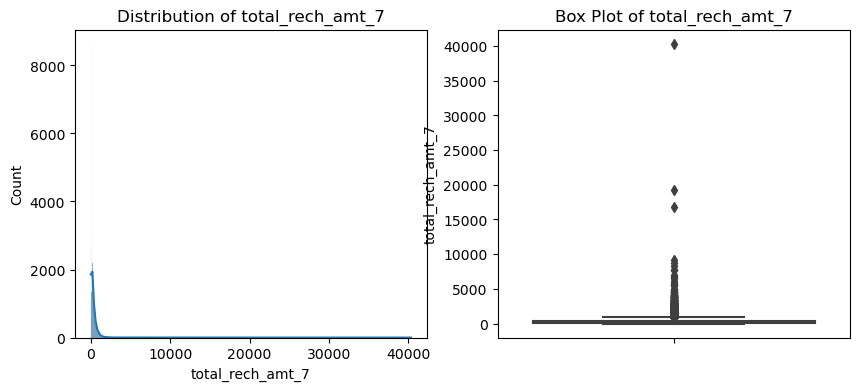

Column: total_rech_amt_8, Missing Data: 0.00%


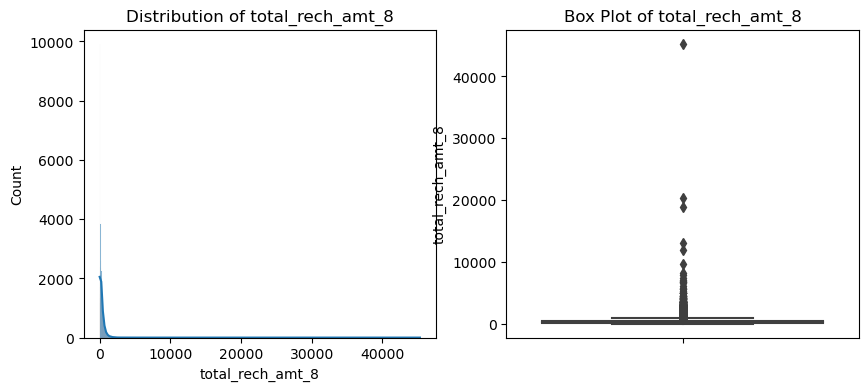

Column: rech_diff_6_8, Missing Data: 0.00%


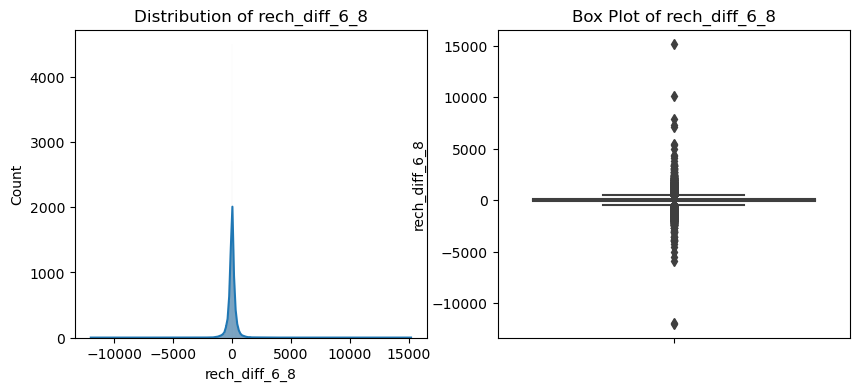

Column: arpu_diff_6_8, Missing Data: 0.00%


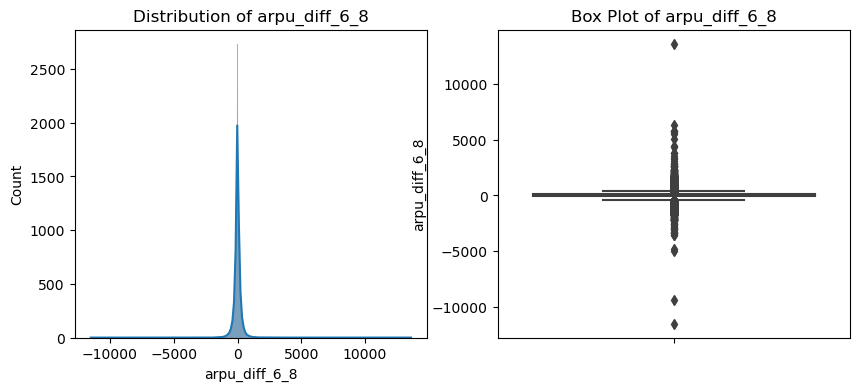

Column: og_mou_diff_6_8, Missing Data: 0.00%


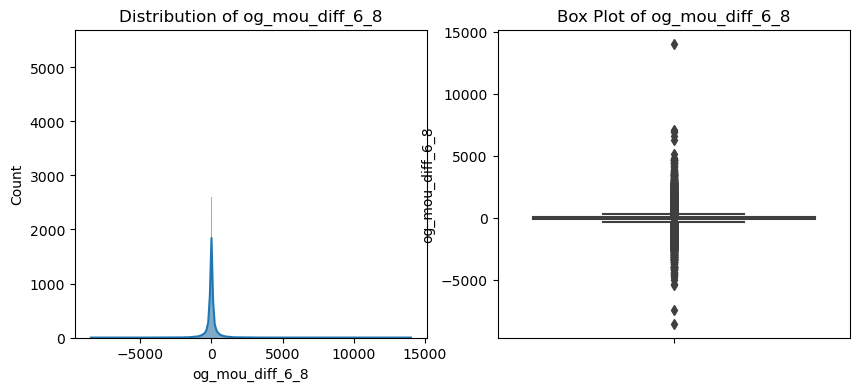

Column: churn_probability, Missing Data: 0.00%


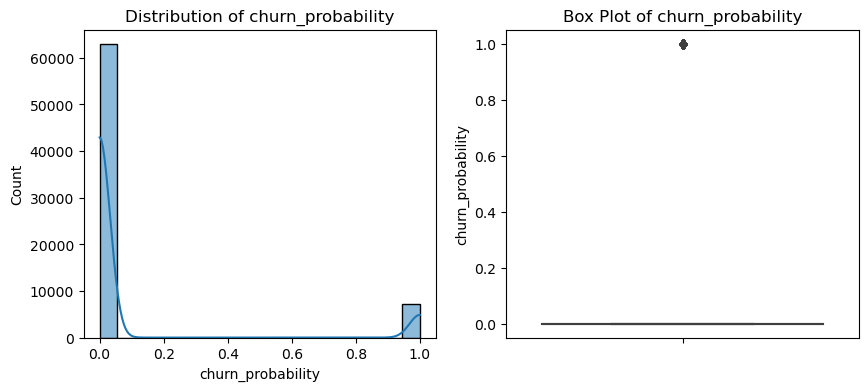

Column: night_pck_user_6, Missing Data: 0.00%


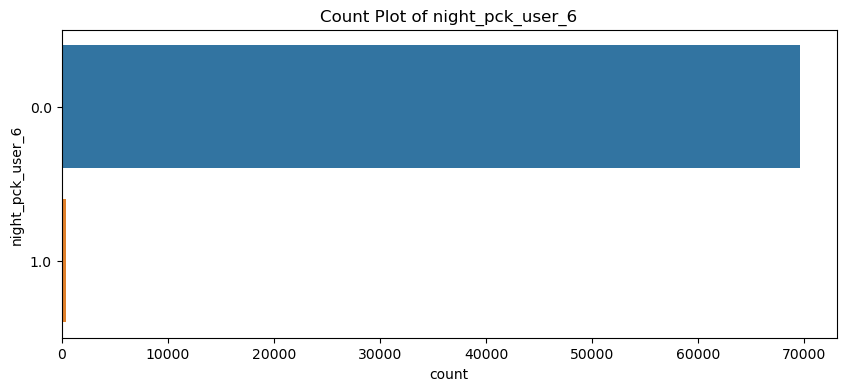

Column: night_pck_user_7, Missing Data: 0.00%


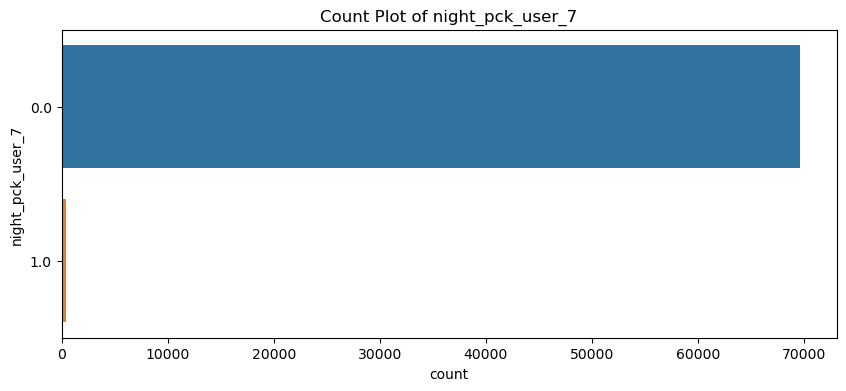

Column: night_pck_user_8, Missing Data: 0.00%


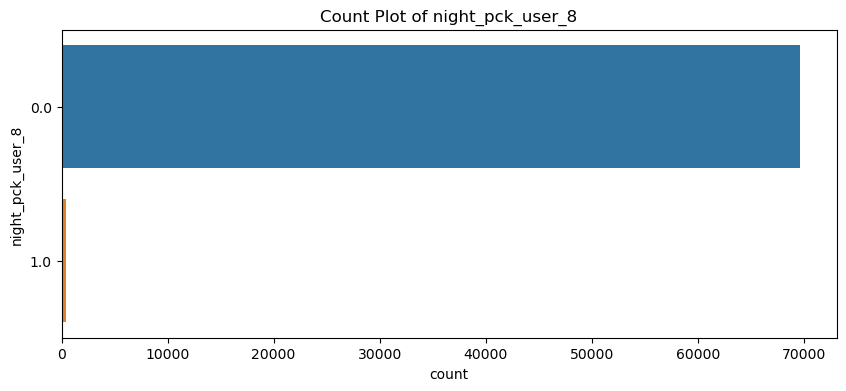

Column: fb_user_6, Missing Data: 0.00%


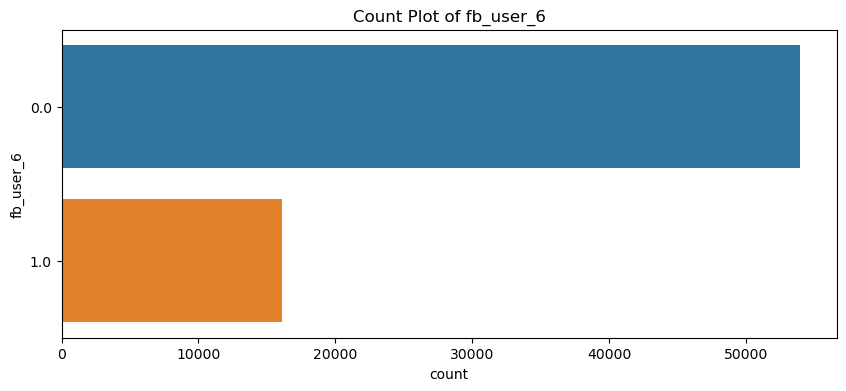

Column: fb_user_7, Missing Data: 0.00%


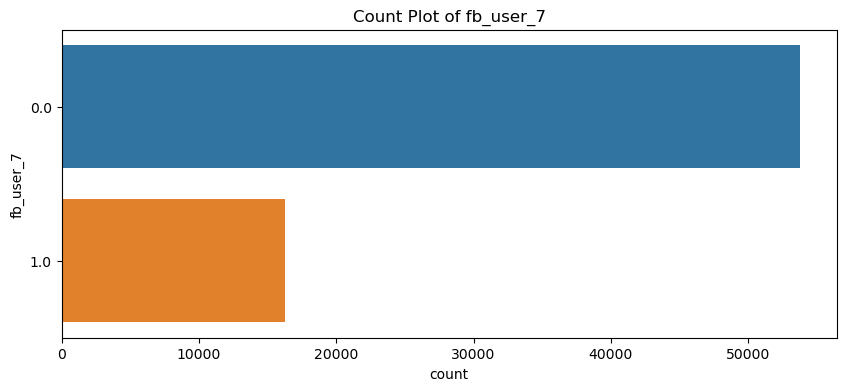

Column: fb_user_8, Missing Data: 0.00%


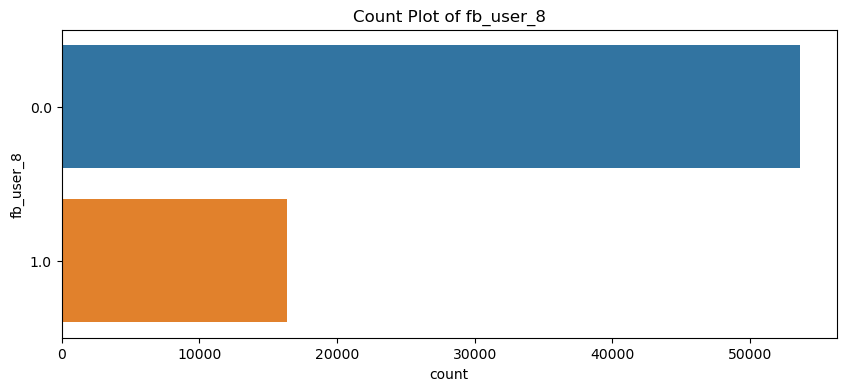

Column: month_present_7, Missing Data: 0.00%


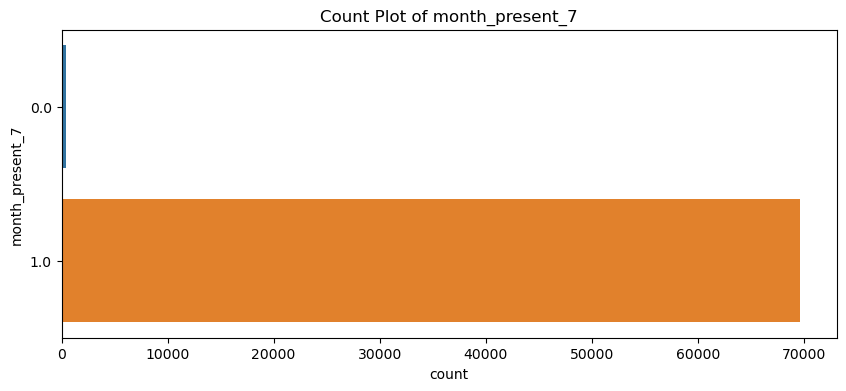

Column: month_present_8, Missing Data: 0.00%


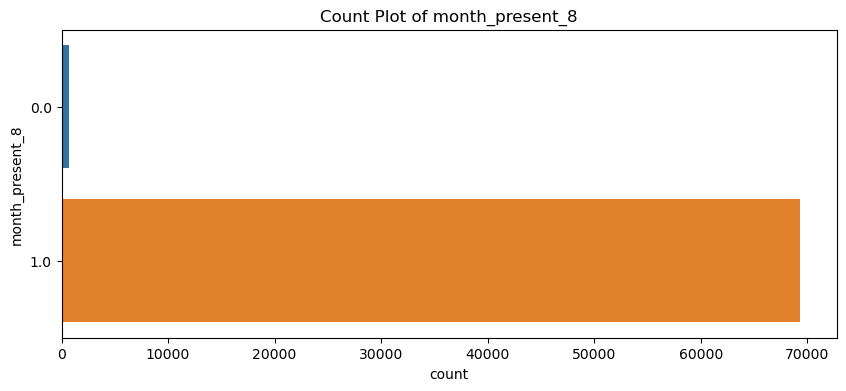

In [30]:
# Define a function for univariate analysis to draw the following only;

# distribution and box plot for numerical columns and;
# count plot for categorical columns

def univariate_analysis(df, column_list, plot_type='numerical'):
    for column in column_list:
        if column not in df.columns:
            print(f"Column {column} not found in dataframe.")
            continue

        missing_percentage = df[column].isna().sum() / len(df) * 100
        print(f"Column: {column}, Missing Data: {missing_percentage:.2f}%")

        if missing_percentage < 30:
            plt.figure(figsize=(10, 4))

            if plot_type == 'numerical':
                # Distribution plot for numerical data
                plt.subplot(1, 2, 1)
                sns.histplot(df[column].dropna(), kde=True)
                plt.title(f'Distribution of {column}')

                plt.subplot(1, 2, 2)
                sns.boxplot(y=df[column].dropna())
                plt.title(f'Box Plot of {column}')
            elif plot_type == 'categorical':
                # Count plot for categorical data
                sns.countplot(y=df[column].dropna())
                plt.title(f'Count Plot of {column}')
            
            plt.show()
        else:
            print(f"Skipping {column} due to high percentage of missing data.")

univariate_analysis(data_refined_1, numeric_cols, plot_type='numerical')
univariate_analysis(data_refined_1, categorical_cols, plot_type='categorical')

#### Bivariate Analysis for numerical variables with churn probability 

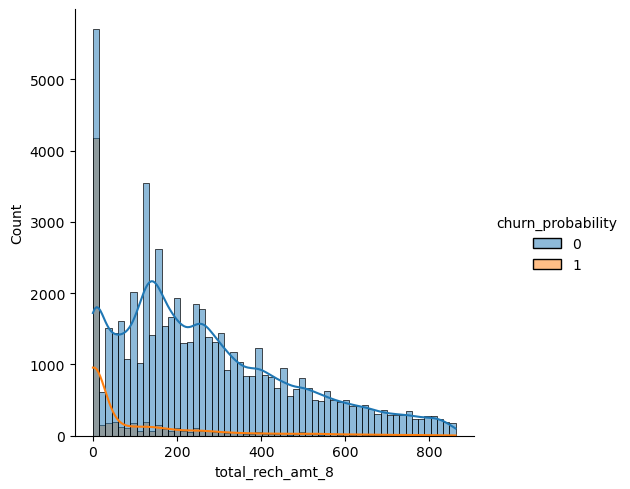

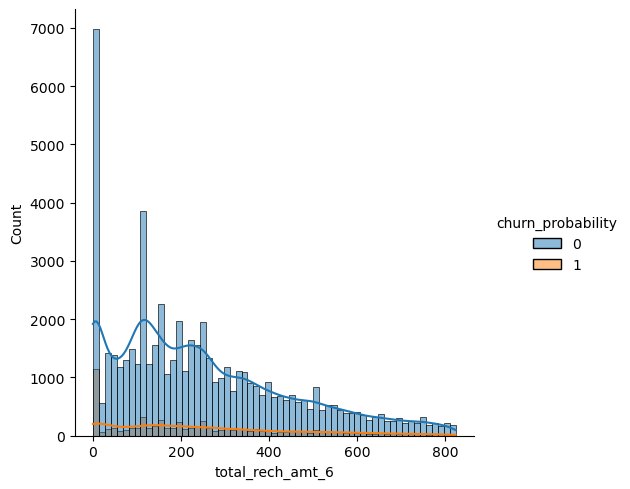

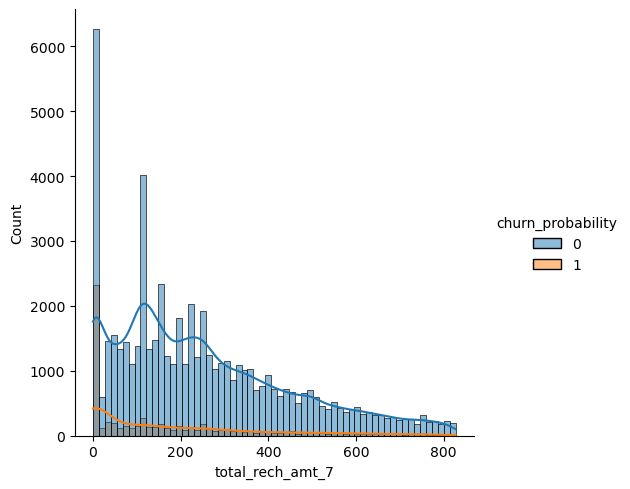

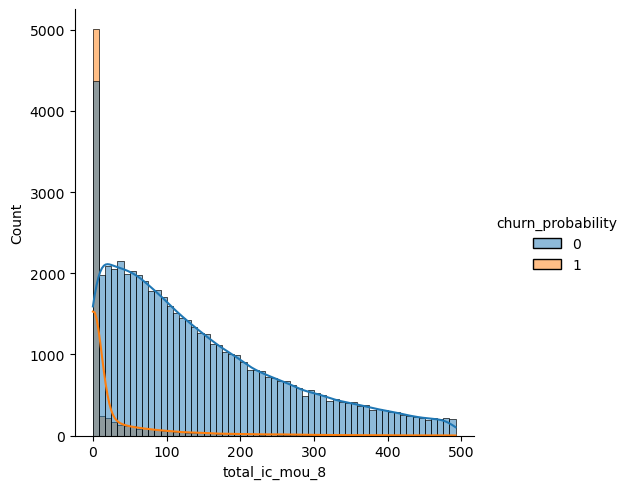

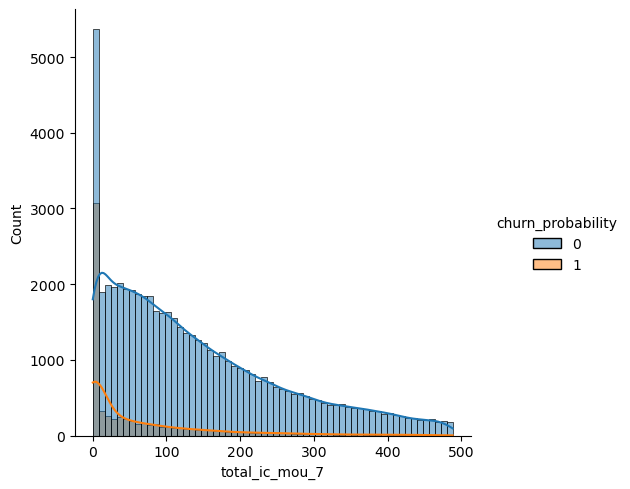

...

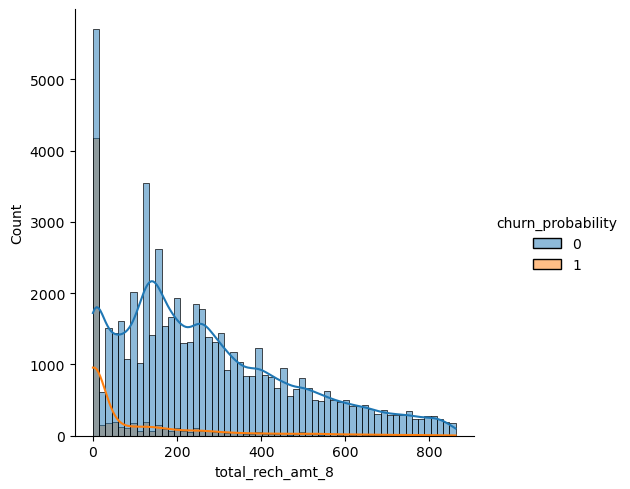

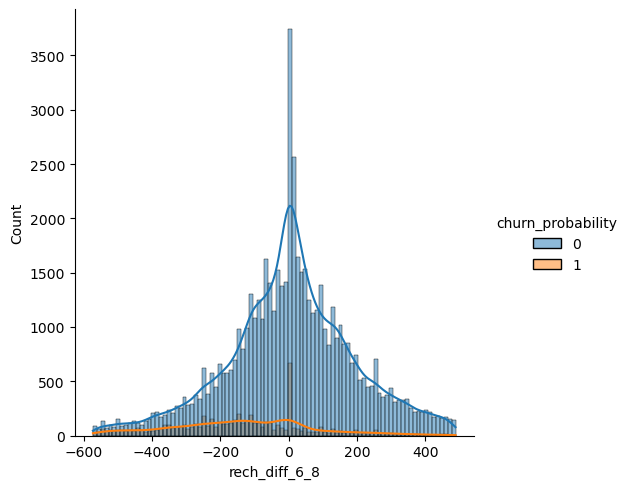

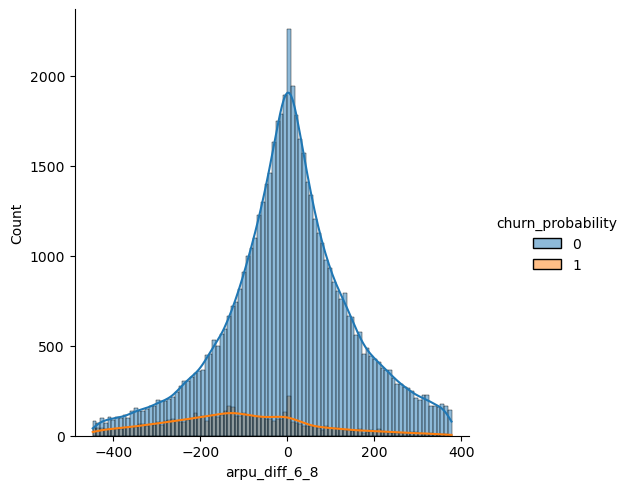

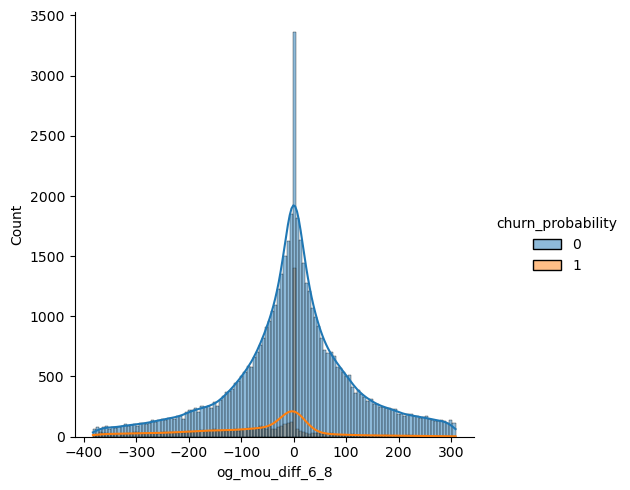

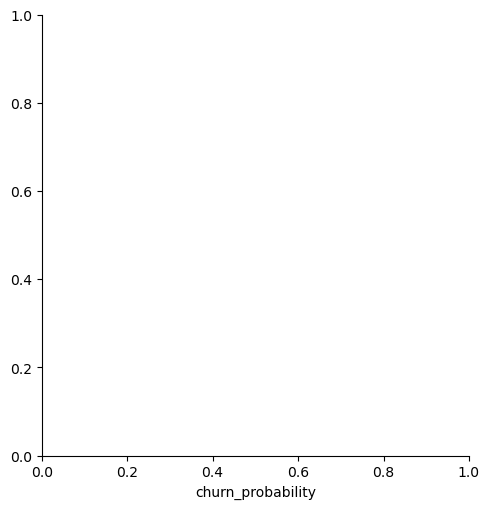

In [31]:
for i in numeric_cols:
    arr=np.array(data_refined_1[i])
    uq=np.percentile(arr,70)
    lq=np.percentile(arr,20)
    iqr=uq-lq
    ul=uq+(1.5*iqr)
    ll=lq-(1.5*iqr)
    grouped_df=data_refined_1[(data_refined_1[i]<ul) & (data_refined_1[i]>ll)]
    sns.displot(data=grouped_df,x=grouped_df[i],kde=True,hue='churn_probability')
    plt.xlabel(i)
    plt.show()

#### Bivariate analysis for categorical variables against churn probability

night_pck_user_6


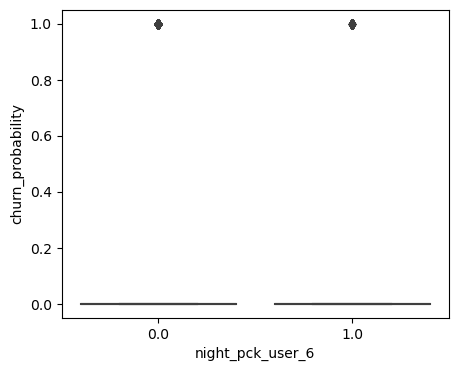

night_pck_user_7


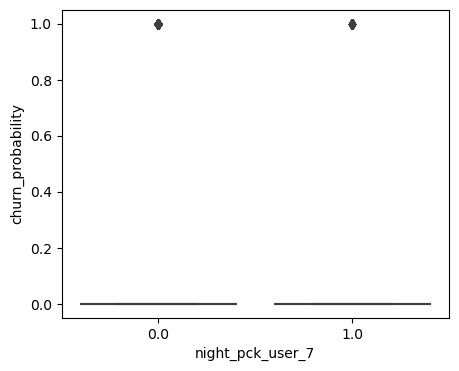

night_pck_user_8


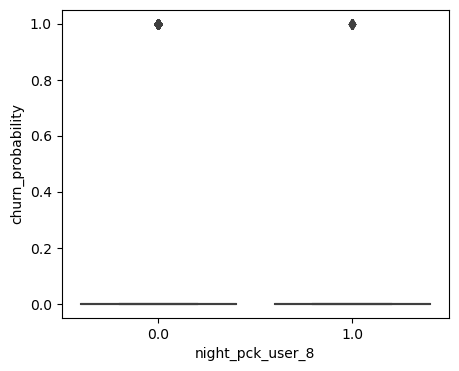

fb_user_6


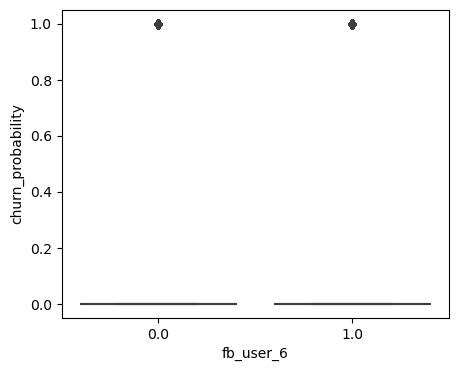

fb_user_7


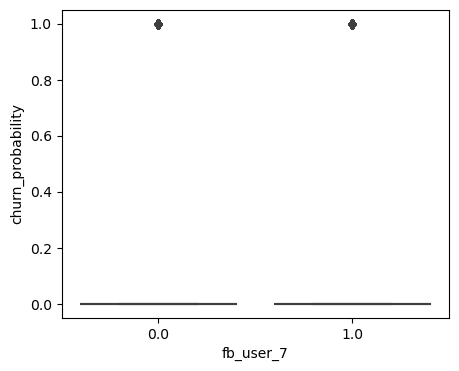

fb_user_8


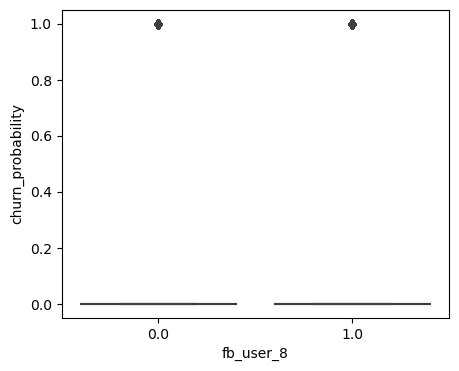

month_present_7


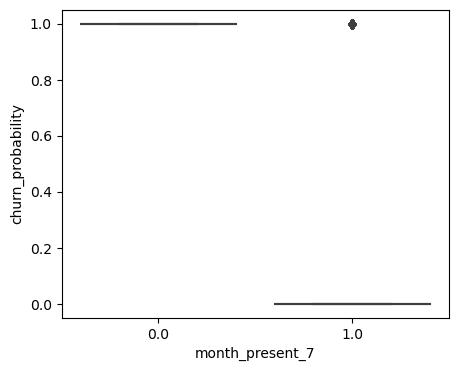

month_present_8


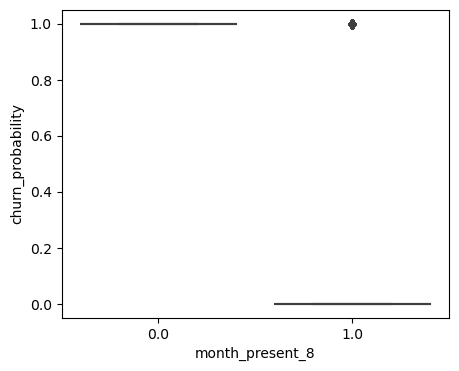

In [32]:
# Bivariate analysis - Box plots for all categorical predictor variables against the target variable saleprice

for col1 in categorical_cols:
        print(col1)
        plt.figure(figsize=(5, 4))
        sns.boxplot(x=col1,y='churn_probability', data = data_refined_1)
        plt.show()

#### Key observation: Churn probability is always 1 for where month_present_7 and month_present_8 are 0. 

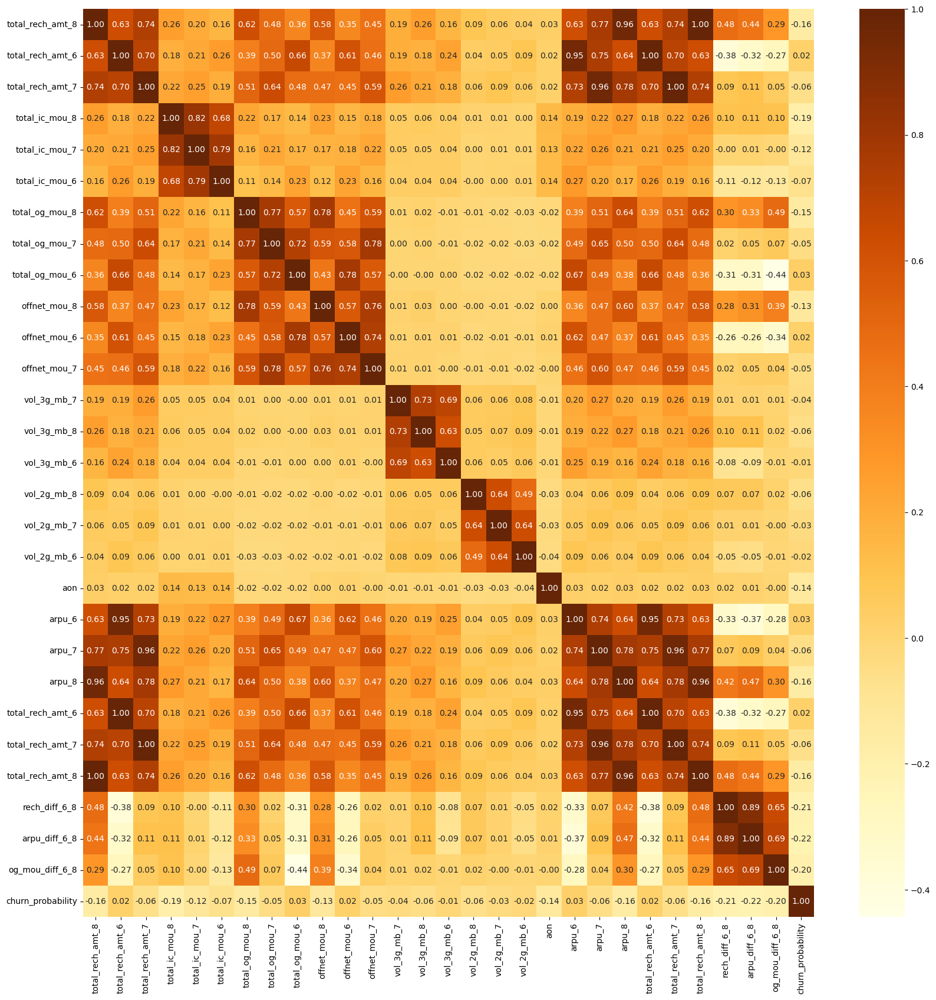

In [33]:
# Correlations
plt.figure(figsize=(20,20))
sns.heatmap(data_refined_1[numeric_cols].corr(),annot=True,fmt='.2f',cmap="YlOrBr")
plt.show()

In [34]:
# Pairplots 
sns.set()
sns.pairplot(data=data_refined_1,vars=numeric_cols, size=2.5)
plt.show()

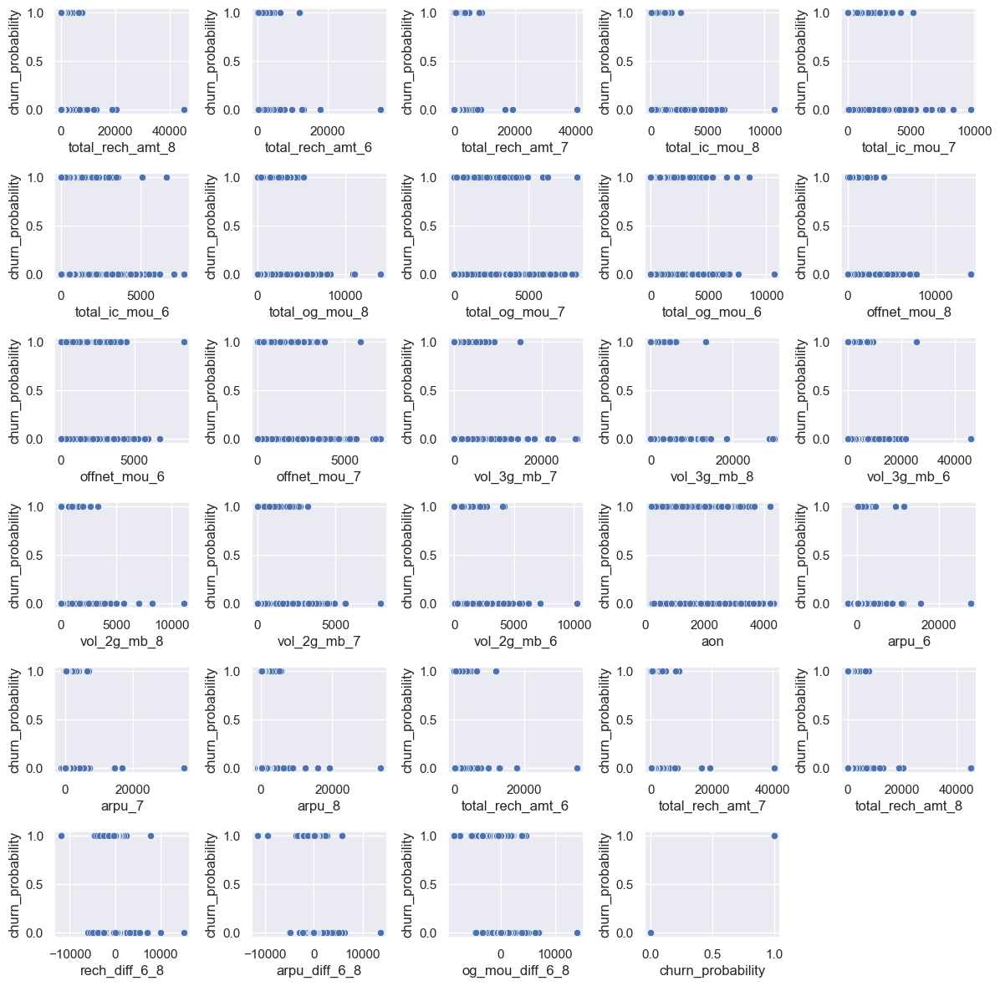

In [35]:
#Check the impact of these columns with churn probability for predictive ability

fig=plt.subplots(figsize=(12, 12))

for i, col in enumerate(numeric_cols):
    plt.subplot(6, 5, i+1)
    plt.subplots_adjust(hspace = 4.0)
    sns.scatterplot(x=data_refined_1[col],y=data_refined_1['churn_probability'])
    plt.tight_layout()

## Model Building and Evaluation:

In [36]:
# Splitting the data to X and y:
y=data_refined_1.pop('churn_probability')
X=data_refined_1

In [37]:
# Importing all the dependencies:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score,precision_score,recall_score,auc,roc_curve,confusion_matrix,f1_score



In [38]:
#Scaling the data:
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)
X_df=pd.DataFrame(X_scaled)
X_df.columns=X.columns
X_df

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8,rech_diff_6_8,arpu_diff_6_8,og_mou_diff_6_8
0,0.0007,0.0023,0.0027,0.0005,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0000,0.0027,0.0001,0.0027,0.0000,0.0000,0.0000,0.0000,0.0391,0.0002,0.0000,0.0001,0.0000,0.0000,0.0001,0.0005,0.0080,0.0005,0.0000,0.0002,0.0000,0.0004,0.0000,0.0013,0.0013,0.0000,0.0000,0.0008,0.0000,0.0000,0.0000,0.0000,0.0023,0.0003,0.0007,0.0000,0.0063,0.0000,0.0039,0.0011,0.0066,0.0077,0.0000,0.0035,0.0000,0.0251,0.0041,0.0032,0.0000,0.0000,0.0137,0.0000,0.0152,0.0005,0.0000,0.0000,0.0000,0.0122,0.0000,0.0003,0.0026,0.0021,0.0000,0.0153,0.0047,0.0000,0.0000,0.0016,0.0004,0.0000,0.0000,0.0000,0.4277,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0022,0.0145,0.0145,0.0176,0.0037,0.0055,0.0015,0.0003,0.0268,0.0076,0.0276,0.0378,0.0764,0.0016,0.0162,0.0000,0.0197,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0210,0.0162,0.0022,0.3000,0.7097,0.2581,1.0000,1.0000,0.4386,0.4572,0.3733
1,0.0010,0.0023,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0847,0.0000,0.0020,0.0000,0.0000,0.0018,0.0000,0.0000,0.0000,0.0000,0.0294,0.0000,0.0006,0.0022,0.0000,0.0000,0.0000,0.0000,0.0000,0.0003,0.0000,0.0000,0.0000,0.0003,0.0002,0.0005,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0037,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0240,0.0130,0.0041,0.0000,0.0008,0.0000,0.0042,0.0000,0.0000,0.0000,0.0020,0.0000,0.0000,0.0000,0.1275,0.0000,0.0000,0.0448,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,

In [39]:
# Doing the test-train split:
X_train,X_test,y_train,y_test=train_test_split(X_df,y,train_size=0.7)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((48999, 154), (21000, 154), (48999,), (21000,))

## Handling Data Imbalance using Random Oversampler

### Note that we need scikitlearn version 1.2.2 for Imblearn to work:

In [40]:
# Importing randomOverSampler from imblearn.
from imblearn.over_sampling import RandomOverSampler
os=RandomOverSampler(sampling_strategy=1)
X_train,y_train=os.fit_resample(X_train,np.array(y_train))
print(X_train.shape,y_train.shape)
y_train.sum()/len(y_train)*100

(88000, 154) (88000,)


50.0

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END ......max_depth=5, n_estimators=20;, score=0.863 total time=   2.4s
[CV 2/3] END ......max_depth=5, n_estimators=20;, score=0.863 total time=   2.3s
[CV 3/3] END ......max_depth=5, n_estimators=20;, score=0.858 total time=   2.3s
[CV 1/3] END ......max_depth=5, n_estimators=30;, score=0.861 total time=   3.4s
[CV 2/3] END ......max_depth=5, n_estimators=30;, score=0.858 total time=   3.4s
[CV 3/3] END ......max_depth=5, n_estimators=30;, score=0.862 total time=   3.4s
[CV 1/3] END ......max_depth=5, n_estimators=50;, score=0.864 total time=   5.6s
[CV 2/3] END ......max_depth=5, n_estimators=50;, score=0.862 total time=   5.6s
[CV 3/3] END ......max_depth=5, n_estimators=50;, score=0.859 total time=   5.5s
[CV 1/3] END .....max_depth=10, n_estimators=20;, score=0.930 total time=   4.3s
[CV 2/3] END .....max_depth=10, n_estimators=20;, score=0.930 total time=   5.1s
[CV 3/3] END .....max_depth=10, n_estimators=20;,

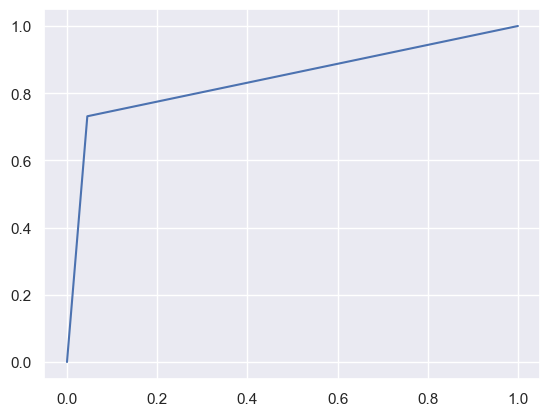

0.9321904761904762 0.6470344255495645 0.8431295327563878 0.6866197183098592
Sensitivity:- 0.7313642756680732
Specificity:- 0.9548947898447024
[[18016   851]
 [  573  1560]]
RandomForest :
accuracy_score is: 0.9321904761904762
precision_score is: 0.6470344255495645
auc_score is: 0.8431295327563878
f1_score is: 0.6866197183098592
__________________________________
Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END .......criterion=gini, max_depth=5;, score=0.868 total time=   2.0s
[CV 2/3] END .......criterion=gini, max_depth=5;, score=0.869 total time=   1.9s
[CV 3/3] END .......criterion=gini, max_depth=5;, score=0.868 total time=   2.0s
[CV 1/3] END ......criterion=gini, max_depth=10;, score=0.918 total time=   3.5s
[CV 2/3] END ......criterion=gini, max_depth=10;, score=0.918 total time=   3.5s
[CV 3/3] END ......criterion=gini, max_depth=10;, score=0.915 total time=   3.5s
[CV 1/3] END ......criterion=gini, max_depth=12;, score=0.933 total time=   4.1s
[CV 2/3]

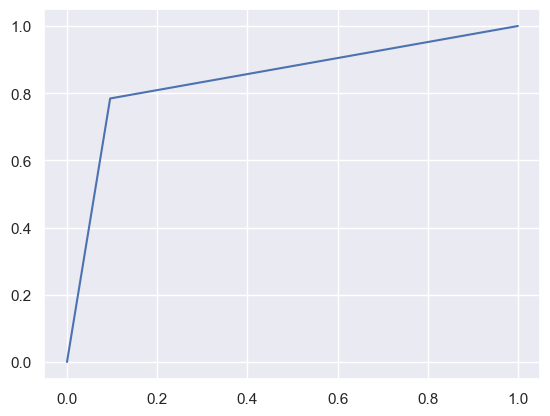

0.892095238095238 0.48088531187122735 0.8443093064584074 0.5962223806129722
Sensitivity:- 0.784341303328645
Specificity:- 0.9042773095881699
[[17061  1806]
 [  460  1673]]
Decision Tree :
accuracy_score is: 0.892095238095238
precision_score is: 0.48088531187122735
auc_score is: 0.8443093064584074
f1_score is: 0.5962223806129722
__________________________________
Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END learning_rate=0.1, n_estimators=20;, score=0.871 total time=  23.4s
[CV 2/3] END learning_rate=0.1, n_estimators=20;, score=0.872 total time=  25.9s
[CV 3/3] END learning_rate=0.1, n_estimators=20;, score=0.869 total time=  22.6s
[CV 1/3] END learning_rate=0.1, n_estimators=50;, score=0.886 total time=  57.5s
[CV 2/3] END learning_rate=0.1, n_estimators=50;, score=0.886 total time=  57.1s
[CV 3/3] END learning_rate=0.1, n_estimators=50;, score=0.882 total time=  57.0s
[CV 1/3] END learning_rate=0.01, n_estimators=20;, score=0.850 total time=  22.7s
[CV 2/3

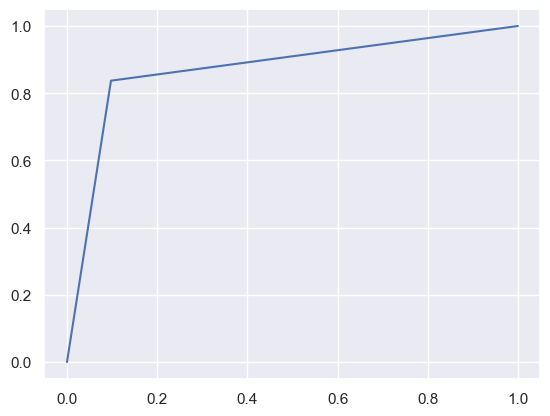

0.8958095238095238 0.492417976288944 0.8698702748389664 0.6201388888888889
Sensitivity:- 0.837318330989217
Specificity:- 0.9024222186887157
[[17026  1841]
 [  347  1786]]
GradientBoostingClassifier :
accuracy_score is: 0.8958095238095238
precision_score is: 0.492417976288944
auc_score is: 0.8698702748389664
f1_score is: 0.6201388888888889
__________________________________
Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END .................C=0.1, penalty=l2;, score=0.790 total time=   2.5s
[CV 2/3] END .................C=0.1, penalty=l2;, score=0.789 total time=   2.4s
[CV 3/3] END .................C=0.1, penalty=l2;, score=0.789 total time=   2.6s
[CV 1/3] END ...........C=0.1, penalty=elasticnet;, score=nan total time=   0.1s
[CV 2/3] END ...........C=0.1, penalty=elasticnet;, score=nan total time=   0.1s
[CV 3/3] END ...........C=0.1, penalty=elasticnet;, score=nan total time=   0.1s
[CV 1/3] END .................C=0.5, penalty=l2;, score=0.813 total time=   1.

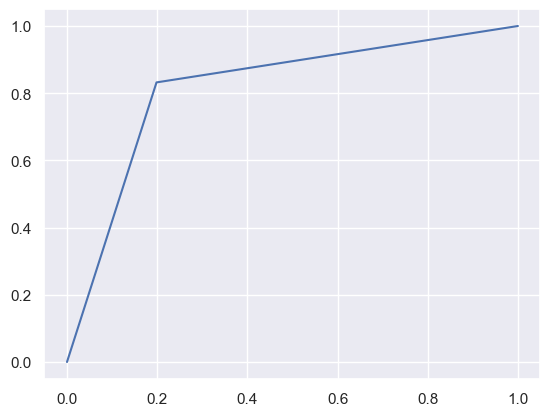

0.8045714285714286 0.3214997283100888 0.8168067731802684 0.4638097726678861
Sensitivity:- 0.8321612751992499
Specificity:- 0.8014522711612869
[[15121  3746]
 [  358  1775]]
LogisticRegression :
accuracy_score is: 0.8045714285714286
precision_score is: 0.3214997283100888
auc_score is: 0.8168067731802684
f1_score is: 0.4638097726678861
__________________________________
Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV 1/3] END learning_rate=0.1, n_estimators=30;, score=0.911 total time=   1.3s
[CV 2/3] END learning_rate=0.1, n_estimators=30;, score=0.910 total time=   1.3s
[CV 3/3] END learning_rate=0.1, n_estimators=30;, score=0.909 total time=   1.3s
[CV 1/3] END learning_rate=0.1, n_estimators=50;, score=0.924 total time=   1.6s
[CV 2/3] END learning_rate=0.1, n_estimators=50;, score=0.923 total time=   2.2s
[CV 3/3] END learning_rate=0.1, n_estimators=50;, score=0.924 total time=   1.9s
[CV 1/3] END learning_rate=0.01, n_estimators=30;, score=0.886 total time=   1.5s
[

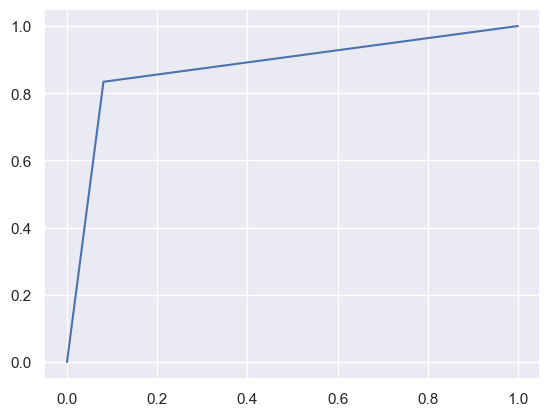

0.9104761904761904 0.5382753403933435 0.8765773024987928 0.6542846634792204
Sensitivity:- 0.8340365682137834
Specificity:- 0.9191180367838024
[[17341  1526]
 [  354  1779]]
XGBClassifier :
accuracy_score is: 0.9104761904761904
precision_score is: 0.5382753403933435
auc_score is: 0.8765773024987928
f1_score is: 0.6542846634792204
__________________________________
Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV 1/3] END ........depth=8, learning_rate=0.1;, score=0.978 total time=  53.5s
[CV 2/3] END ........depth=8, learning_rate=0.1;, score=0.980 total time=  52.2s
[CV 3/3] END ........depth=8, learning_rate=0.1;, score=0.977 total time=  50.6s
[CV 1/3] END .......depth=8, learning_rate=0.01;, score=0.934 total time=  59.2s
[CV 2/3] END .......depth=8, learning_rate=0.01;, score=0.935 total time=  46.9s
[CV 3/3] END .......depth=8, learning_rate=0.01;, score=0.934 total time=  47.8s
[CV 1/3] END .......depth=10, learning_rate=0.1;, score=0.981 total time= 2.3min
[CV 2/3

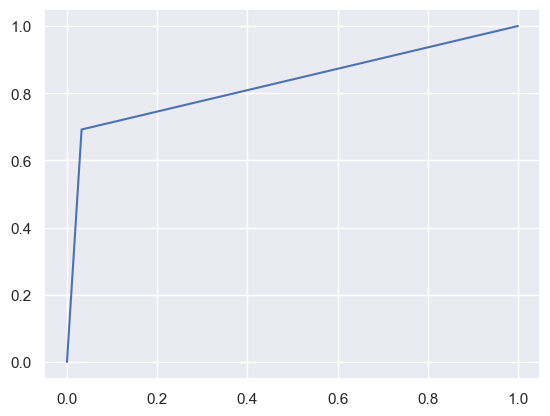

0.9396190476190476 0.7072352659319597 0.8297992677590569 0.6995260663507108
Sensitivity:- 0.6919831223628692
Specificity:- 0.9676154131552446
[[18256   611]
 [  657  1476]]
CatBoostClassifier :
accuracy_score is: 0.9396190476190476
precision_score is: 0.7072352659319597
auc_score is: 0.8297992677590569
f1_score is: 0.6995260663507108
__________________________________
Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END learning_rate=0.1, n_estimators=20;, score=0.841 total time=   9.0s
[CV 2/3] END learning_rate=0.1, n_estimators=20;, score=0.838 total time=   8.8s
[CV 3/3] END learning_rate=0.1, n_estimators=20;, score=0.835 total time=   8.9s
[CV 1/3] END learning_rate=0.1, n_estimators=30;, score=0.846 total time=  13.0s
[CV 2/3] END learning_rate=0.1, n_estimators=30;, score=0.844 total time=  13.3s
[CV 3/3] END learning_rate=0.1, n_estimators=30;, score=0.844 total time=  13.1s
[CV 1/3] END learning_rate=0.1, n_estimators=50;, score=0.856 total time=  21.8s
[C

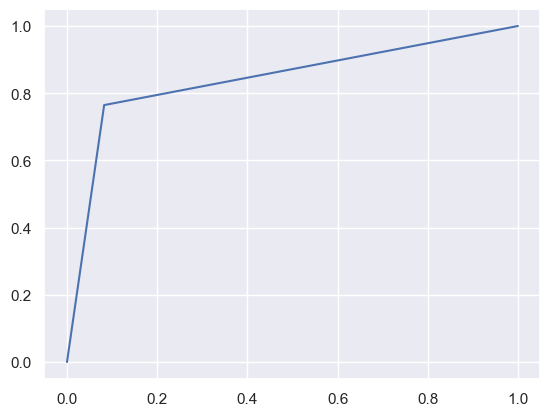

0.9020476190476191 0.5119271814187069 0.8411158440715776 0.6132731716488061
Sensitivity:- 0.7646507266760432
Specificity:- 0.9175809614671119
[[17312  1555]
 [  502  1631]]
AdaBoostClassifier :
accuracy_score is: 0.9020476190476191
precision_score is: 0.5119271814187069
auc_score is: 0.8411158440715776
f1_score is: 0.6132731716488061
__________________________________


In [44]:
models={
                'RandomForest': RandomForestClassifier(),
                'Decision Tree': DecisionTreeClassifier(),
                'GradientBoostingClassifier': GradientBoostingClassifier(),
                'LogisticRegression': LogisticRegression(),
                'XGBClassifier': XGBClassifier(),
                'CatBoostClassifier': CatBoostClassifier(verbose=False),
                'AdaBoostClassifier': AdaBoostClassifier()


            }
params={
    'RandomForest': {'n_estimators':[20,30,50],
                    'max_depth':[5,10,12],
                    },
    'Decision Tree':{'criterion' : ["gini","entropy"],
                     'max_depth':[5,10,12],
      
                    } ,
    'GradientBoostingClassifier':{'learning_rate':[0.1,0.01,0.001],
                         
                         'n_estimators':[20,50]
                        } ,
    'LogisticRegression':{'penalty':['l2','elasticnet'],
                          'C':[0.1,0.5,1]} ,
    
    'XGBClassifier':{'learning_rate':[0.1,0.01],
                     'n_estimators':[30,50]
        
    },
    'CatBoostClassifier':{'learning_rate':[0.1,0.01],
                         'depth':[8,10]} ,
    'AdaBoostClassifier':{'learning_rate':[0.1,0.01,0.001],
                          
                          'n_estimators':[20,30,50]
                         }
        
    } 
report={}
for i in range(len(list(models.keys()))):
    model_cv=GridSearchCV(estimator=models[list(models.keys())[i]],param_grid=params[list(models.keys())[i]],cv=3,verbose=3)
    model_cv.fit(X_train,y_train)
    model=model_cv.best_estimator_
    model.fit(X_train,y_train)
    y_pred=model.predict(X_test)
    score=accuracy_score(y_test,y_pred)
    
    precision=precision_score(y_test,y_pred)
    fpr,tpr,threshold=roc_curve(y_test,y_pred)
    f1=f1_score(y_test,y_pred)
    score_auc=auc(fpr,tpr)
    confusion=confusion_matrix(y_test,y_pred)
    plt.plot(fpr,tpr)
    plt.show()
    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    
    # Sensitivity
    print("Sensitivity:-",TP / float(TP+FN))

    # Specificity
    print("Specificity:-", TN / float(TN+FP))

    print(confusion)
    
    
    print(list(models.keys())[i],':')
    print('accuracy_score is:',score)
    print('precision_score is:',precision)
    
    print('auc_score is:',score_auc)
    print('f1_score is:',f1)
    
    
    print('__________________________________')
    report[list(models.keys())[i]]=(model,score)



In [46]:
report

{'RandomForest': (RandomForestClassifier(max_depth=12, n_estimators=50),
  0.9321904761904762),
 'Decision Tree': (DecisionTreeClassifier(max_depth=12), 0.892095238095238),
 'GradientBoostingClassifier': (GradientBoostingClassifier(n_estimators=50),
  0.8958095238095238),
 'LogisticRegression': (LogisticRegression(C=1), 0.8045714285714286),
 'XGBClassifier': (XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=None, device=None, early_stopping_rounds=None,
                enable_categorical=False, eval_metric=None, feature_types=None,
                gamma=None, grow_policy=None, importance_type=None,
                interaction_constraints=None, learning_rate=0.1, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=None, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=

## Applying PCA for dimensionality reduction:

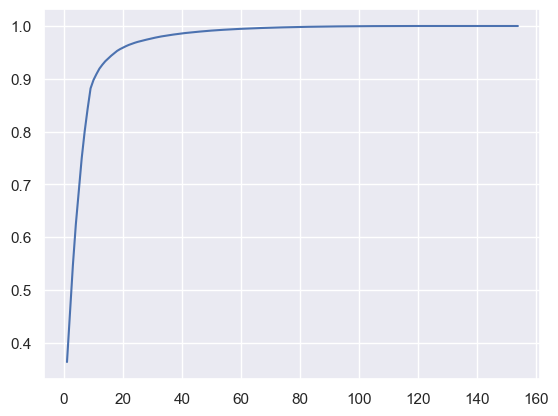

In [608]:
from sklearn.decomposition import PCA
pca=PCA(random_state=42)
X_train_transformed=pca.fit_transform(X_train)
cum_sum=np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1,X_train.shape[1]+1),cum_sum)
plt.show()


In [612]:
pca2=PCA(n_components=30,random_state=42)
X_train_transformed=pca2.fit_transform(X_train)
X_test_transformed=pca2.transform(X_test)

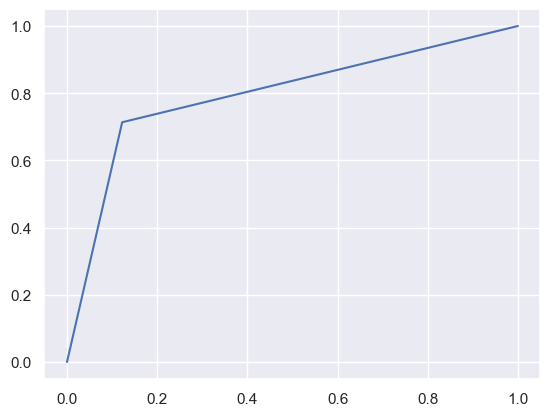

0.7761904761904762 0.3972853040981467 0.7955829976315815 0.5103957075788061
Sensitivity:- 0.7135489920300047
Specificity:- 0.8776170032331584
[[16558  2309]
 [  611  1522]]
Applying Decision tree after PCA transformation :
accuracy_score is: 0.7761904761904762
precision_score is: 0.3972853040981467
auc_score is: 0.7955829976315815
f1_score is: 0.5103957075788061


In [618]:
rf2=RandomForestClassifier(random_state=42,max_depth=10)
rf2.fit(X_train_transformed,y_train)

y_pred=rf2.predict(X_test_transformed)

precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
f1=f1_score(y_test,y_pred)
score_auc=auc(fpr,tpr)
confusion=confusion_matrix(y_test,y_pred)
plt.plot(fpr,tpr)
plt.show()
print(score,precision,score_auc,f1)
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

    
    # Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

    # Specificity
print("Specificity:-", TN / float(TN+FP))

print(confusion)
    
    
print('Applying Decision tree after PCA transformation',':')
print('accuracy_score is:',score)
print('precision_score is:',precision)
    
print('auc_score is:',score_auc)
print('f1_score is:',f1)

### As can be seen that after performing training on the PCA transformed data,there is a significant decrease in the accuracy score, hence we are moving ahead with the original dataset without any dimensionality reduction

In [427]:

#1.final_model=RandomForestClassifier(random_state=42,max_depth=10)
#2.final_model=report['XGBClassifier'][0]
#3.final_model=report['CatBoostClassifier'][0]


In [512]:
best=0
for i in report:
    if report[i][1]>best:
        best=report[i][1]
        best_model=report[i][0]
        
final_model=best_model


In [428]:
final_model.fit(X_train,y_train)


RandomForestClassifier(max_depth=10, random_state=42)

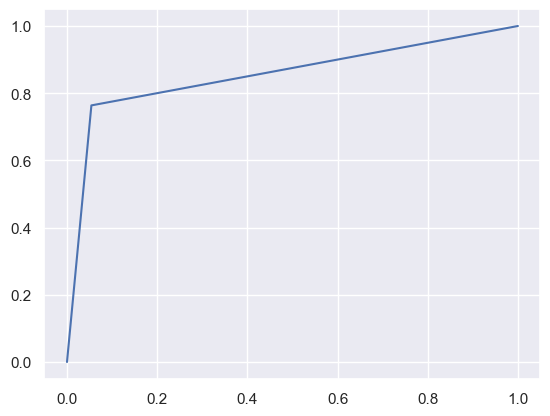

0.9273809523809524 0.6147169811320755 0.8547987142509224 0.6811624503449718
Sensitivity:- 0.7637130801687764
Specificity:- 0.9458843483330683
[[17846  1021]
 [  504  1629]]
CatBoostClassifier :
accuracy_score is: 0.9273809523809524
precision_score is: 0.6147169811320755
auc_score is: 0.8547987142509224
f1_score is: 0.6811624503449718


In [429]:
y_pred=final_model.predict(X_test)
score=accuracy_score(y_test,y_pred)
    
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
f1=f1_score(y_test,y_pred)
score_auc=auc(fpr,tpr)
confusion=confusion_matrix(y_test,y_pred)
plt.plot(fpr,tpr)
plt.show()
print(score,precision,score_auc,f1)
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

    
    # Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

    # Specificity
print("Specificity:-", TN / float(TN+FP))

print(confusion)
    
    
print(list(models.keys())[i],':')
print('accuracy_score is:',score)
print('precision_score is:',precision)
    
print('auc_score is:',score_auc)
print('f1_score is:',f1)

In [599]:
pd.DataFrame(final_model.predict_proba(X_test)[:,1])

,0
0,0.0001
1,0.0235
2,0.9790
3,0.0267
4,0.0016
...,...
20995,0.0008
20996,0.0008
20997,0.0022
20998,0.0009


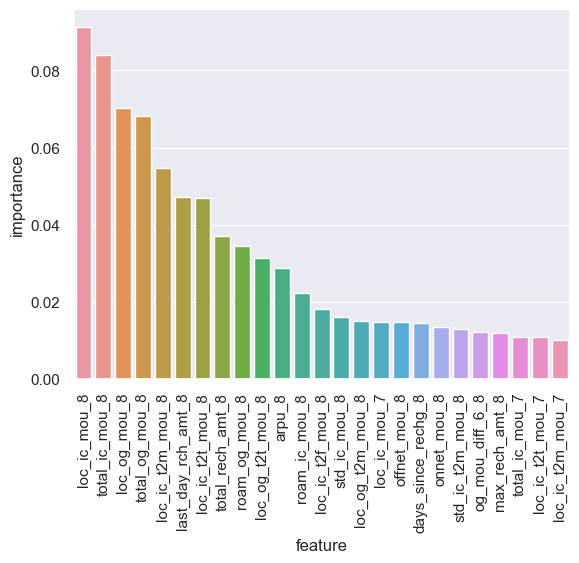

The top features are:

1 . loc_ic_mou_8
2 . total_ic_mou_8
3 . loc_og_mou_8
4 . total_og_mou_8
5 . loc_ic_t2m_mou_8
6 . last_day_rch_amt_8
7 . loc_ic_t2t_mou_8
8 . total_rech_amt_8
9 . roam_og_mou_8
10 . loc_og_t2t_mou_8
11 . arpu_8
12 . roam_ic_mou_8
13 . loc_ic_t2f_mou_8
14 . std_ic_mou_8
15 . loc_og_t2m_mou_8
16 . loc_ic_mou_7
17 . offnet_mou_8
18 . days_since_rechg_8
19 . onnet_mou_8
20 . std_ic_t2m_mou_8
21 . og_mou_diff_6_8
22 . max_rech_amt_8
23 . total_ic_mou_7
24 . loc_ic_t2t_mou_7
25 . loc_ic_t2m_mou_7


In [507]:
#Plotting the top 15 important features:
feature_dict=[]
for i in range(len(final_model.feature_names_in_)):
    feature_dict.append((final_model.feature_names_in_[i],final_model.feature_importances_[i]))
feature_importance=pd.DataFrame(feature_dict,columns=['feature','importance']).sort_values(by='importance',ascending=False)

sns.barplot(x=feature_importance.head(25)['feature'],y=feature_importance.head(25)['importance'])
plt.xticks(rotation=90)
plt.show()
top_features=list(feature_importance.head(25)['feature'])
print('The top features are:\n')
for i in range(25):
    print(i+1,'.',top_features[i])


### Test data preparation and prediction:

### Steps for running the predictions on test data
1) Import the test file
2) Before running predictions on test data, we apply all the data transformation including scaling & PCA on test data too.

In [430]:
test_data=pd.read_csv('/Users/rishismac/telecom-churn-case-study-hackathon-c58/test.csv')


In [431]:
test_data[recharge_cols] = test_data[recharge_cols].apply(lambda x: x.fillna(0))

In [432]:
flag_cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']

In [433]:
test_data[flag_cols] = test_data[flag_cols].apply(lambda x: x.fillna(0))

In [434]:
#use the columns from the training list of transformation steps

imp_cols = list(data_refined_1.columns)


In [435]:
#Prepare a list of columns to drop from the latest list of columns from data_refined_1
drop_from_imp_cols = [ 
                      'days_since_rechg_6', 'days_since_rechg_7', 'days_since_rechg_8', 
                      'month_present_7', 'month_present_8', 
                      'rech_diff_6_8', 'arpu_diff_6_8', 'og_mou_diff_6_8'
                                           
                     ]

#'month_present_6' is not included in this list


In [436]:
#Drop the values from the list
for attr in drop_from_imp_cols:
    imp_cols.remove(attr)


In [437]:
#Prepare a list of columns to add to imp_cols variable and add them  

add_to_imp_cols = ["date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8",
                      "last_date_of_month_6","last_date_of_month_7","last_date_of_month_8"]

for attr in add_to_imp_cols:
    imp_cols.append(attr)

In [438]:
test_data_refined_1=test_data[imp_cols]
test_data_refined_1

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8
0,21.9800,31.5100,4.3400,8.3600,0.0000,0.0000,0.0000,26.4300,0.0300,0.0000,0.0000,29.4300,21.0600,9.5300,28.4800,4.3400,0.0000,0.0000,0.0300,0.0000,0.3900,34.8300,0.0000,23.1100,0.0000,0.0000,2.0500,30.3300,0.0000,0.0000,0.0000,10.2100,0.2600,40.8100,0.0000,0.3600,0.3600,0.5400,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,42.0300,24.8800,43.0100,0.0000,6.9000,0.0000,60.1600,18.1300,31.7800,48.9300,20.2300,10.8900,0.0000,7.6800,1.0400,1.0400,0.0000,0.3400,32.1600,0.0000,20.2300,0.0000,0.0000,0.0000,13.5800,7.6800,0.0000,0.0000,42.1600,44.7100,0.0000,0.0000,4.5900,0.0000,0.0000,0.0000,37.5600,0.0000,0.0000,0.0000,1692,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0000,0,0.0000,0.0000,0.0000,0.0000,0,0,0,0,0,0,0,0,0,0,0.0000,69999,0.0000,60,103,4,5,5,36.2600,43.5600,41.7300,57.9400,52.3900,91.9400,64.4450,65.3300,91.8820,90,50,0.0000,30,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,30,30,30,6/21/2014,7/26/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
1,2.6100,187.4300,0.0000,377.2600,0.0000,0.0000,0.0000,17.6800,0.0000,0.0000,0.0000,397.1100,19.8400,184.8100,17.6800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,394.9400,94.2300,19.8400,0.8000,0.0000,0.0000,19.9900,0.0000,0.0000,0.0000,160.1900,1.4900,181.6900,0.0000,0.0000,0.0000,0.0000,114.6300,0.0000,0.0000,0.7300,0.0000,0.0000,0.0000,75.5100,549.8600,0.0000,0.0000,0.0000,474.3400,473.6100,75.5100,0.0000,41.2100,598.0800,0.0000,23.7600,12.5100,12.5100,0.0000,0.0000,621.8400,177.8800,41.2100,0.0000,0.0000,0.0000,0.0000,23.7600,0.0000,0.0000,149.2400,639.2900,0.0000,0.0000,122.2900,0.0000,0.0000,0.0000,26.9500,0.0000,0.0000,0.0000,2533,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0000,0,0.0000,0.0000,0.0000,0.0000,0,0,0,0,0,0,0

In [439]:
date_variables=[x for x in test_data_refined_1.columns if test_data_refined_1[x].dtype=='O']
date_variables
##Extracting days of the month into separate columns
length=len(date_variables)
for i in range(length):
    string='day_from_'+date_variables[i]
    test_data_refined_1[string] = pd.DatetimeIndex(test_data_refined_1[date_variables[i]]).day
    date_variables.append(string)


In [440]:
# Difference between last date of recharge and last date of month to calculate recency.

test_data_refined_1["days_since_rechg_6"] = (test_data_refined_1["day_from_last_date_of_month_6"] - test_data_refined_1["day_from_date_of_last_rech_6"])+1
date_variables.append('days_since_rechg_6')

test_data_refined_1["days_since_rechg_7"] = (test_data_refined_1["day_from_last_date_of_month_7"] - test_data_refined_1["day_from_date_of_last_rech_7"])+1
date_variables.append('days_since_rechg_7')

test_data_refined_1["days_since_rechg_8"] = (test_data_refined_1["day_from_last_date_of_month_8"] - test_data_refined_1["day_from_date_of_last_rech_8"])+1
date_variables.append('days_since_rechg_8')

# Derive presence or absence of last date of month columns.

test_data_refined_1["month_present_6"] = (test_data_refined_1["day_from_last_date_of_month_6"] - test_data_refined_1["day_from_last_date_of_month_6"])+1
date_variables.append('month_present_6')

test_data_refined_1["month_present_7"] = (test_data_refined_1["day_from_last_date_of_month_7"] - test_data_refined_1["day_from_last_date_of_month_7"])+1
date_variables.append('month_present_7')

test_data_refined_1["month_present_8"] = (test_data_refined_1["day_from_last_date_of_month_8"] - test_data_refined_1["day_from_last_date_of_month_8"])+1
date_variables.append('month_present_8')


In [441]:
drop_variables=['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6',
 'day_from_date_of_last_rech_8',
 'day_from_date_of_last_rech_7',
 'day_from_date_of_last_rech_6',
 'day_from_last_date_of_month_8',
 'day_from_last_date_of_month_7',
 'day_from_last_date_of_month_6',]
test_data_refined_1 = test_data_refined_1.drop(drop_variables, axis=1)

In [442]:
days_col_impute = ["days_since_rechg_6","days_since_rechg_7","days_since_rechg_8", "month_present_6","month_present_7","month_present_8"]
    
test_data_refined_1[days_col_impute] = test_data_refined_1[days_col_impute].apply(lambda x: x.fillna(0))


In [443]:
# cols_to_impute list
cols_to_impute = []
for col in test_data_refined_1.select_dtypes(include=['float64','int64']).columns:
    if test_data_refined_1[col].isnull().any():
        cols_to_impute.append(col)
cols_to_impute

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_t2c_mou_6',
 'offnet_mou_6',
 'loc_og_t2m_mou_6',
 'onnet_mou_6

In [444]:
test_data_refined_1[cols_to_impute] = test_data_refined_1[cols_to_impute].apply(lambda x: x.fillna(0))

In [445]:
#Calculating difference columns similar to training data set
test_data_refined_1['rech_diff_6_8']=test_data_refined_1['total_rech_amt_8']-test_data_refined_1['total_rech_amt_6']
test_data_refined_1['arpu_diff_6_8']=test_data_refined_1['arpu_8']-test_data_refined_1['arpu_6']
test_data_refined_1['og_mou_diff_6_8']=test_data_refined_1['total_og_mou_8']-test_data_refined_1['total_og_mou_6']

In [446]:
#drop month_present_6 as this was removed from training dataset for single unique value
test_data_refined_1 = test_data_refined_1.drop('month_present_6',axis=1)

In [447]:
#Confirm same number of columns exist in training dataset
test_data_refined_1.shape

(30000, 154)

In [448]:
#Confirm same number of columns exist in training dataset (excluding churn probability)
data_refined_1.shape

(69999, 154)

In [449]:
list(test_data_refined_1.columns)

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_t2c_mou_6',
 'offnet_mou_6',
 'loc_og_t2m_mou_6',
 'onnet_mou_6

#### Test data now prepared for running PCA, Scaling and then predictions

In [450]:
test_data_refined_1
X_test_scaled=scaler.transform(test_data_refined_1)
y_pred=final_model.predict(X_test_scaled)


In [451]:
y_pred=pd.Series(y_pred)


In [452]:
test_df=pd.concat([test_data_refined_1,y_pred],axis=1)


In [453]:
test_df=test_df.set_index('id')


In [454]:
sample=pd.DataFrame(test_df[0])
sample.columns=['churn_probability']
sample.to_csv('SG_NBS_first.csv')

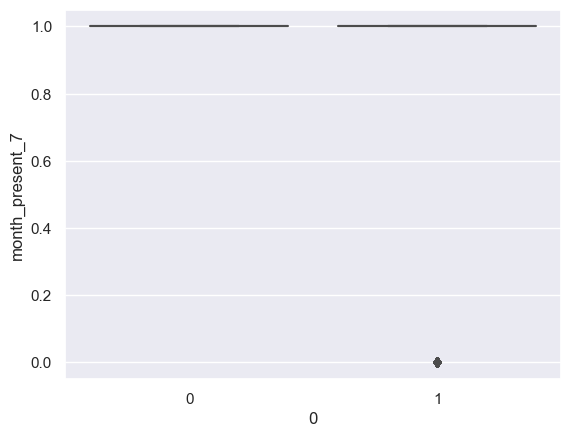

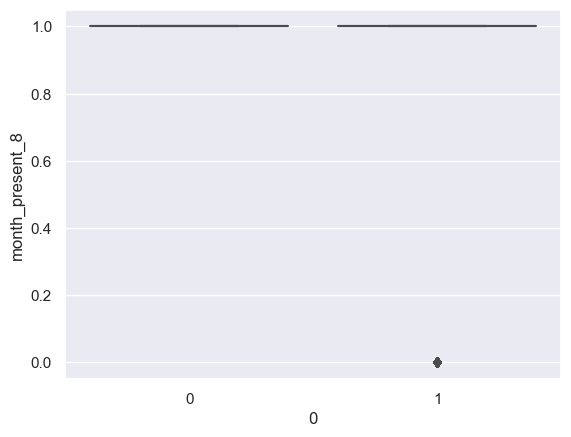

In [455]:
sns.boxplot(x=test_df[0],y=test_df['month_present_7'])
plt.show()
sns.boxplot(x=test_df[0],y=test_df['month_present_8'])
plt.show()

## Training the final model on entire dataset and checking for improvements in accuracy:

In [629]:
os=RandomOverSampler(sampling_strategy=1)
X_whole,y_whole=os.fit_resample(X_df,np.array(y))
print(X_whole.shape,y_whole.shape)
y_whole.sum()/len(y_whole)*100

(125734, 154) (125734,)


50.0

In [630]:
final_model.fit(X_whole,y_whole)
y_pred=final_model.predict(X_test_scaled)


In [631]:
y_pred=pd.Series(y_pred)
test_df=pd.concat([test_data_refined_1,y_pred],axis=1)
test_df=test_df.set_index('id')
sample=pd.DataFrame(test_df[0])
sample.columns=['churn_probability']
sample.to_csv('SG_NBS_fourth.csv')

## Building a model for interpretation:

In [513]:
#Applying Logistic Regression using statsmodel in order to interpret better and find robust features:
import statsmodels.api as sm
from sklearn.feature_selection import RFE
lr=LogisticRegression()
rfe=RFE(lr,n_features_to_select=30)
rfe.fit(X_train,y_train)
list(zip(X_train.columns, rfe.support_, rfe.ranking_))
col = X_train.columns[rfe.support_]
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                88000
Model:                            GLM   Df Residuals:                    87969
Model Family:                Binomial   Df Model:                           30
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -36730.
Date:                Sun, 31 Mar 2024   Deviance:                       73460.
Time:                        01:41:51   Pearson chi2:                 1.57e+13
No. Iterations:                    27   Pseudo R-squ. (CS):             0.4239
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 32.4384    1.4e+04      0.002      0.998   -2.74e+04    2.75e+04
loc_ic_t2t_mou_8    1.065e+06   1.85e+04     57.670      0.000    1.03e+06     1.1e+06
loc_ic_mou_8       -1.078e+06   1.87e+04    -57.673      0.000   -1.11e+06   -1.04e+06
loc_og_t2m_mou_8     -15.4988      1.427    -10.864      0.000     -18.295     -12.703
std_og_t2f_mou_8      -6.9065      1.192     -5.796      0.000      -9.242      -4.571
loc_ic_t2f_mou_8    1.669e+05   2894.016     57.663      0.000    1.61e+05    1.73e+05
loc_og_mou_8          -8.5548      1.821     -4.698      0.000     -12.124      -4.986
loc_ic_t2m_mou_8    6.245e+05   1.08e+04     57.670      0.000    6.03e+05    6.46e+05
std_ic_t2f_mou_8     -24.5414      3.550     -6.913      0.000     -31.499     -17.584
roam_og_mou_8         14.0047      1.275     10.984      0.000      11.506      16.504
spl_og_mou_8          -5.0430      1.007     -5.010      0.000      -7.016      -3.070
roam_ic_mou_8          2.9785      1.213      2.455      0.014       0.600       5.357
spl_ic_mou_8         -98.1678      3.026    -32.441      0.000    -104.099     -92.237
isd_ic_mou_8           9.8444      1.021      9.640      0.000       7.843      11.846
loc_ic_t2f_mou_6      -0.3405      1.032     -0.330      0.741      -2.363       1.682
spl_ic_mou_6          -6.8567      1.460     -4.696      0.000      -9.718      -3.995
roam_og_mou_6          2.8614      0.668      4.286      0.000       1.553       4.170
roam_ic_mou_7          6.4689      1.135      5.700      0.000       4.244       8.693
spl_ic_mou_7          -6.5310      1.233     -5.298      0.000      -8.947      -4.115
aug_vbc_3g            -6.8270      0.827     -8.251      0.000      -8.449      -5.205
monthly_2g_8          -4.5451      0.265    -17.177      0.000      -5.064      -4.026
total_rech_num_8     -10.0513      0.401    -25.067      0.000     -10.837      -9.265
total_rech_num_7       3.7401      0.317     11.788      0.000       3.118       4.362
total_ic_mou_8       -13.7103      1.820     -7.534      0.000     -17.277     -10.143
arpu_7                28.6151      1.978     14.469      0.000      24.739      32.491
arpu_6                 6.1778      2.122      2.911      0.004       2.019      10.337
total_rech_data_8     -9.6904      0.542    -17.865      0.000     -10.754      -8.627
last_day_rch_amt_8   -22.1070      0.702    -31.505      0.000     -23.482     -20.732
month_present_8      -26.9806    1.4e+04     -0.002      0.998   -2.75e+04    2.74e+04
rech_diff_6_8         -6.3805      1.581     -4.035      0.000      -9.480      -3.281
og_mou_diff_6_8       -7.4754      0.826     -9.045      0.000      -9.095      -5.856
======================================================================================
"""

In [516]:
#Checking VIF for the above model:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train_sm.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,loc_ic_mou_8,1265907184.3300
7,loc_ic_t2m_mou_8,568270456.6100
1,loc_ic_t2t_mou_8,352026554.6800
5,loc_ic_t2f_mou_8,26008211.0500
0,const,3418.2000
23,total_ic_mou_8,9.2800
25,arpu_6,4.2300
29,rech_diff_6_8,3.9800
3,loc_og_t2m_mou_8,3.2800
6,loc_og_mou_8,2.9900


In [525]:
X_train_sm2=X_train_sm.drop(['loc_ic_mou_8','month_present_8','total_ic_mou_8'],axis=1)

In [526]:
logm3 = sm.GLM(y_train,X_train_sm2, family = sm.families.Binomial())
res = logm3.fit()
res.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                88000
Model:                            GLM   Df Residuals:                    87972
Model Family:                Binomial   Df Model:                           27
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -39535.
Date:                Sun, 31 Mar 2024   Deviance:                       79070.
Time:                        01:45:21   Pearson chi2:                 1.88e+14
No. Iterations:                     8   Pseudo R-squ. (CS):             0.3860
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  4.3790      0.736      5.950      0.000       2.937       5.821
loc_ic_t2t_mou_8     -81.0530      3.523    -23.005      0.000     -87.958     -74.147
loc_og_t2m_mou_8     -20.1721      1.585    -12.729      0.000     -23.278     -17.066
std_og_t2f_mou_8      -9.9978      1.296     -7.712      0.000     -12.539      -7.457
loc_ic_t2f_mou_8     -40.1323      2.006    -20.007      0.000     -44.064     -36.201
loc_og_mou_8         -11.4439      2.045     -5.596      0.000     -15.452      -7.436
loc_ic_t2m_mou_8     -43.8346      1.416    -30.946      0.000     -46.611     -41.058
std_ic_t2f_mou_8     -35.6696      3.863     -9.233      0.000     -43.241     -28.098
roam_og_mou_8         15.6392      1.256     12.454      0.000      13.178      18.100
spl_og_mou_8          -8.2643      1.104     -7.486      0.000     -10.428      -6.101
roam_ic_mou_8          3.2359      1.207      2.682      0.007       0.871       5.601
spl_ic_mou_8        -104.3394      3.059    -34.107      0.000    -110.335     -98.343
isd_ic_mou_8           4.2371      0.723      5.858      0.000       2.819       5.655
loc_ic_t2f_mou_6       2.5372      0.964      2.631      0.009       0.647       4.428
spl_ic_mou_6          -7.9171      1.396     -5.671      0.000     -10.653      -5.181
roam_og_mou_6          2.4731      0.670      3.691      0.000       1.160       3.786
roam_ic_mou_7          6.9696      1.164      5.989      0.000       4.689       9.250
spl_ic_mou_7          -8.7835      1.195     -7.353      0.000     -11.125      -6.442
aug_vbc_3g            -7.7522      0.816     -9.496      0.000      -9.352      -6.152
monthly_2g_8          -4.9057      0.263    -18.672      0.000      -5.421      -4.391
total_rech_num_8     -12.9636      0.406    -31.951      0.000     -13.759     -12.168
total_rech_num_7       2.9173      0.317      9.216      0.000       2.297       3.538
arpu_7                22.9067      2.052     11.163      0.000      18.885      26.929
arpu_6                14.3265      2.109      6.792      0.000      10.192      18.461
total_rech_data_8    -10.1165      0.555    -18.229      0.000     -11.204      -9.029
last_day_rch_amt_8   -26.4866      0.725    -36.555      0.000     -27.907     -25.066
rech_diff_6_8         -5.8357      1.592     -3.665      0.000      -8.956      -2.715
og_mou_diff_6_8       -6.5388      0.825     -7.929      0.000      -8.155      -4.922
======================================================================================
"""

In [595]:
imp_features=list(X_train_sm2.columns)
imp_features

['const',
 'loc_ic_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_ic_t2m_mou_8',
 'std_ic_t2f_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'isd_ic_mou_8',
 'loc_ic_t2f_mou_6',
 'spl_ic_mou_6',
 'roam_og_mou_6',
 'roam_ic_mou_7',
 'spl_ic_mou_7',
 'aug_vbc_3g',
 'monthly_2g_8',
 'total_rech_num_8',
 'total_rech_num_7',
 'arpu_7',
 'arpu_6',
 'total_rech_data_8',
 'last_day_rch_amt_8',
 'rech_diff_6_8',
 'og_mou_diff_6_8']

In [527]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train_sm2.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm2.values, i) for i in range(X_train_sm2.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,3340.3800
23,arpu_6,4.1900
26,rech_diff_6_8,3.9700
2,loc_og_t2m_mou_8,3.2800
5,loc_og_mou_8,2.9900
10,roam_ic_mou_8,2.8500
20,total_rech_num_8,2.8200
22,arpu_7,2.6800
16,roam_ic_mou_7,2.4800
21,total_rech_num_7,2.4400


In [528]:
important_features_stats_model=list(vif.Features)
important_features_stats_model

['const',
 'arpu_6',
 'rech_diff_6_8',
 'loc_og_t2m_mou_8',
 'loc_og_mou_8',
 'roam_ic_mou_8',
 'total_rech_num_8',
 'arpu_7',
 'roam_ic_mou_7',
 'total_rech_num_7',
 'og_mou_diff_6_8',
 'loc_ic_t2f_mou_8',
 'loc_ic_t2f_mou_6',
 'roam_og_mou_8',
 'loc_ic_t2m_mou_8',
 'roam_og_mou_6',
 'last_day_rch_amt_8',
 'total_rech_data_8',
 'spl_ic_mou_6',
 'spl_ic_mou_7',
 'aug_vbc_3g',
 'loc_ic_t2t_mou_8',
 'monthly_2g_8',
 'spl_og_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2f_mou_8',
 'spl_ic_mou_8',
 'isd_ic_mou_8']

In [540]:
y_train

array([0, 0, 0, ..., 1, 1, 1])

In [541]:
y_pred=res.predict(X_train_sm2)
y_pred
pred_df=pd.DataFrame({'Churn':y_train,'Prob_churn':y_pred})
pred_df['Predicted_churn']=pred_df['Prob_churn'].apply(lambda x: 0 if x<=0.3 else 1)
pred_df

,Churn,Prob_churn,Predicted_churn
0,0,0.5326,1
1,0,0.5692,1
2,0,0.0430,0
3,0,0.6959,1
4,0,0.8264,1
...,...,...,...
87995,1,0.8370,1
87996,1,0.8888,1
87997,1,0.1601,0
87998,1,0.8594,1


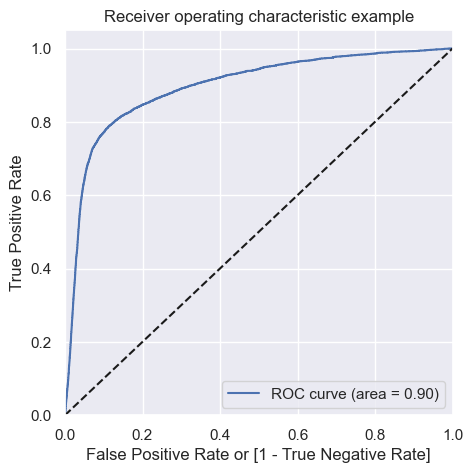

In [543]:
from sklearn.metrics import roc_curve,roc_auc_score
def draw_roc( actual, probs ):
    fpr, tpr, thresholds =roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

# Calling the function
fpr, tpr, thresholds = roc_curve( pred_df.Churn, pred_df.Prob_churn, drop_intermediate = False )




draw_roc(pred_df.Churn,pred_df.Prob_churn)


In [544]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
pred_df=pred_df.drop('Predicted_churn',axis=1)
for i in numbers:
    pred_df[i]= pred_df.Prob_churn.map(lambda x: 1 if x > i else 0)
pred_df.head()

,Churn,Prob_churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.5326,1,1,1,1,1,1,0,0,0,0
1,0,0.5692,1,1,1,1,1,1,0,0,0,0
2,0,0.0430,1,0,0,0,0,0,0,0,0,0
3,0,0.6959,1,1,1,1,1,1,1,0,0,0
4,0,0.8264,1,1,1,1,1,1,1,1,1,0


In [580]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix(pred_df.Churn, pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

         prob  accuracy  sensitivity  specificity
0.0000 0.0000    0.5000       1.0000       0.0000
0.1000 0.1000    0.6633       0.9692       0.3573
0.2000 0.2000    0.7171       0.9492       0.4851
0.3000 0.3000    0.7564       0.9252       0.5875
0.4000 0.4000    0.7891       0.8972       0.6810
0.5000 0.5000    0.8146       0.8612       0.7680
0.6000 0.6000    0.8335       0.8198       0.8471
0.7000 0.7000    0.8331       0.7509       0.9152
0.8000 0.8000    0.7022       0.4336       0.9707
0.9000 0.9000    0.5370       0.0809       0.9931


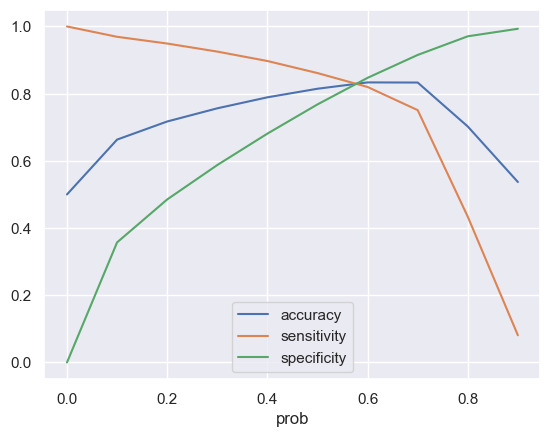

In [581]:
## Plotting graph of a dataframe using pandas cool feature:

cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specificity'])
plt.show()


In [585]:
i=0.59
final_df=pred_df[['Churn','Prob_churn']]
final_df[i]= pred_df.Prob_churn.map(lambda x: 1 if x > i else 0)
final_df.head()

,Churn,Prob_churn,0.59
0,0,0.5326,0
1,0,0.5692,0
2,0,0.0430,0
3,0,0.6959,1
4,0,0.8264,1


In [586]:
cm1 = confusion_matrix(final_df.Churn, final_df[0.59] )
total=sum(sum(cm1))
accuracy = (cm1[0,0]+cm1[1,1])/total
    
speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])


In [587]:
accuracy

0.8312954545454545

In [ ]:
## Finally narrowing down on the most important model parameters for interpretation:


In [645]:
coef_df=pd.DataFrame(res.params,columns=['Coef'])
positive_coef=coef_df[coef_df['Coef']>0].sort_values(by='Coef',ascending=False)

negative_coef=coef_df[coef_df['Coef']<0].sort_values(by='Coef')
negative_coef

,Coef
spl_ic_mou_8,-104.3394
loc_ic_t2t_mou_8,-81.0530
loc_ic_t2m_mou_8,-43.8346
loc_ic_t2f_mou_8,-40.1323
std_ic_t2f_mou_8,-35.6696
last_day_rch_amt_8,-26.4866
loc_og_t2m_mou_8,-20.1721
total_rech_num_8,-12.9636
loc_og_mou_8,-11.4439
total_rech_data_8,-10.1165


## Final Recommendations:
### The following features are the ones to look out for in case of churn:
Top Negative influencers:
- spl_ic_mou_8: Customers having high churn probability tend to decrease their special incoming minutes of usage
significantly in the action phase.
- loc_ic_t2t_mou_8:Incoming local calls minutes of usage- within same telecom circle and same network also tend to increase significantly in action phase.
- loc_ic_t2m_mou_8:Incoming local calls minutes of usage - within same telecom circle and to other telecom operators also tend to increase significantly in action phase.
- loc_ic_t2f_mou_8: Incoming local calls minutes of usage - within same telecom circle and to fixed lines also tend to increase significantly in action phase.
- std_ic_t2f_mou_8: Incoming STD calls minutes of usage - outside the calling circle  and to fixed lines also tend to increase significantly in action phase.

- loc_og_t2m_mou_8: Outgoing Local calls minutes of usage - within same telecom circle and to other telecom operators also tend to increase significantly in action phase.
- total_rech_num_8: Total recharge number also decreases in the action phase
